In [1]:
# # No need to run - Already run
# # update pip and conda
# !pip install --upgrade pip
# !sudo conda update -n base -y conda

# # install extensions
# !conda install -c conda-forge -y rise
# !conda install -c conda-forge -y jupyter_contrib_nbextensions
# !jupyter nbextension enable toc2/main 

# # main libraries
# !pip install pandas
# !pip install numpy
# !pip install matplotlib

# Data Visualisation with Python

<img src='images/landscape-colors.png'>

## Introduction

### Which plot to make?

<img src='images/poster_big.png'>
<img src='images/legend.png'>
<img src='images/numeric.png'>
<img src='images/categorical.png'>
<img src='images/catandnum.png'>
<img src='images/relational.png'>
<img src='images/maps.png'>
<img src='images/Timeseries.png'>

### Imperative vs. Declarative programming 

**Imperative**
- Specify How something should be done
- Specification & Execution intertwined.
- “Put a red circle here and a blue circle here”

**Declarative**
- Specify What should be done.
- Separates Specification from Execution
- “Map x to a position, and y to a color”

*"Declarative visualization lets you think about data and relationships, rather than incidental details", Jake Vanderplas*

### What we'll see

- Static plots
    - Matplotlib
    - Seaborn
    - Pandas
    - Plotnine
- Interactive plots
    - Plotly
    - Plotly Express
    - Bokeh
    - Holoviews
    - Altair
    - Ipywidgets
    - qgrid (Pandas)

- Web app
    - Dash Plotly
    - Bokeh Server
- Specific
    - Machine learning: Facets by P+AIR
    - NAs: Missingno
    - Text: word_cloud, scattertext
    - Maps: plotly, geoplotlib, geoplot gmaps, folium, ipyleaflet, GeoViews.
    - Large datasets: Datashader, Vaex, OpenGL (Vispy and Glumpy), YT, GR framework, GlueViz, Lightning

### Imports libraries and dataset

In [1]:
# libraries
import pandas as pd
import numpy as np

In [2]:
# data for examples
iris = pd.read_csv('data/iris.csv')
iris.head()

,sepalLength,sepalWidth,petalLength,petalWidth,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [3]:
# data for exercises 1 - mostly numerical values
cars = pd.read_csv('data/auto-mpg.csv')
cars['horsepower'] = pd.to_numeric(cars['horsepower'], errors='coerce')
cars = cars.dropna(axis='rows')
countries = pd.DataFrame({'origin':[1,2,3],
                          'country': ['USA', 'Europe', 'Japan']})
cars = cars.merge(countries, on='origin')
cars = cars.drop('origin', axis='columns')
cars.head()
# cars.info()
# cars.describe()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,car_name,country
0,18.0,8,307.0,130.0,3504,12.0,70,chevrolet chevelle malibu,USA
1,15.0,8,350.0,165.0,3693,11.5,70,buick skylark 320,USA
2,18.0,8,318.0,150.0,3436,11.0,70,plymouth satellite,USA
3,16.0,8,304.0,150.0,3433,12.0,70,amc rebel sst,USA
4,17.0,8,302.0,140.0,3449,10.5,70,ford torino,USA


In [4]:
# data for exercises 2 - mostly categories
titanic = pd.read_csv('data/titanic.csv')
titanic.head()
# titanic.info()
# titanic.describe()

,Unnamed: 0,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [5]:
# data for exercises 3 
tips = pd.read_csv('data/tips.csv')
tips = tips.drop(['Unnamed: 0'], axis='columns')
tips.head()
# tips.info()
# tips.describe()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Static plots

### Matplotlib

Description:
- Matplotlib is the first plotting library
- Based on Matlab

Strengths and Weaknesses:
- Strengths
    - Designed like MatLab: switching was easy
    - Many rendering backends 
    - Can reproduce just about any plot with a bit of effort 
    - Well-tested, standard tool for over a decade 
- Weaknesses
    - API is imperative & often overly verbose 
    - Sometimes poor stylistic defaults 
    - Poor support for web/interactive graphs 
    - Often slow for large & complicated data

<img src='images/matplotlib.PNG'>

Many librariries want to keep matplotlib's strengths and get rid of its weaknesses. One solution is thus to build on top of matplotlib. 

Doc: https://matplotlib.org/contents.html

**Imports**

In [7]:
# imports
import matplotlib.pyplot as plt

**Basic plots**

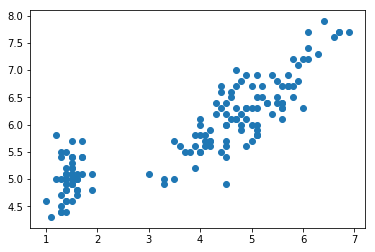

In [8]:
# MATPLOTLIB - Scatter plot
fig, ax = plt.subplots(figsize=(6,4)) 
plt.scatter(iris['petalLength'], iris['sepalLength']);

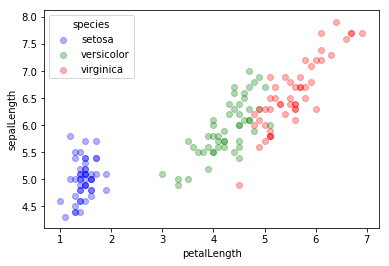

In [13]:
# MATPLOTLIB - Scatter plot by group
fig, ax = plt.subplots(figsize=(6,4))
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
for species, group in iris.groupby('species'):
    ax.scatter(group['petalLength'], group['sepalLength'],
                color=color_map[species],
                alpha=0.3, edgecolor=None,
                label=species)
plt.legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength');

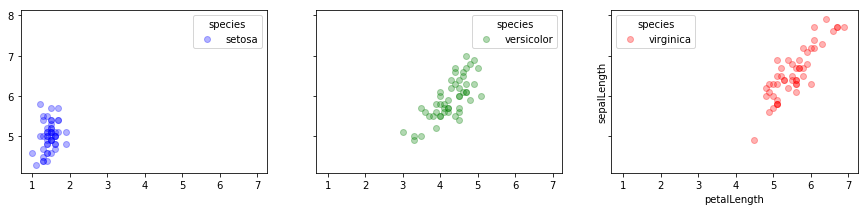

In [9]:
# MATPLOTLIB - Scatter plot by group with facets
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
n_panels = len(color_map)
fig, ax = plt.subplots(1, n_panels, figsize=(n_panels * 5, 3),
                       sharex=True, sharey=True)
for i, (species, group) in enumerate(iris.groupby('species')):
    ax[i].scatter(group['petalLength'], group['sepalLength'],
                  color=color_map[species],
                  alpha=0.3, edgecolor=None,
                  label=species)
    ax[i].legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength');

**Aesthetics**

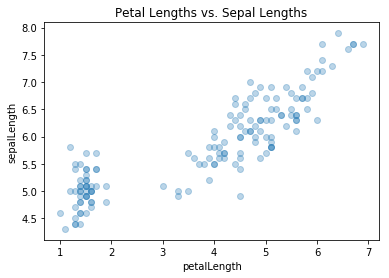

In [10]:
# MATPLOTLIB - Scatter plot
fig, ax = plt.subplots(figsize=(6,4)) 
plt.scatter(iris['petalLength'], iris['sepalLength'], alpha=0.3)
plt.xlabel('petalLength')
plt.ylabel('sepalLength')
plt.title('Petal Lengths vs. Sepal Lengths');

In [11]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,car_name,country
0,18.0,8,307.0,130.0,3504,12.0,70,chevrolet chevelle malibu,USA
1,15.0,8,350.0,165.0,3693,11.5,70,buick skylark 320,USA
2,18.0,8,318.0,150.0,3436,11.0,70,plymouth satellite,USA
3,16.0,8,304.0,150.0,3433,12.0,70,amc rebel sst,USA
4,17.0,8,302.0,140.0,3449,10.5,70,ford torino,USA


**Exercise 1** 

Plot the evolution of horsepower per year

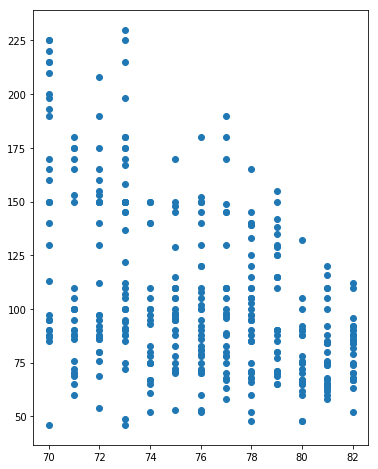

In [14]:
fig, ax = plt.subplots(figsize=(6,8)) 
plt.scatter(cars['model_year'], cars['horsepower']);

**Exercise 2** 

Plot the evolution of horsepower per year by cylinders

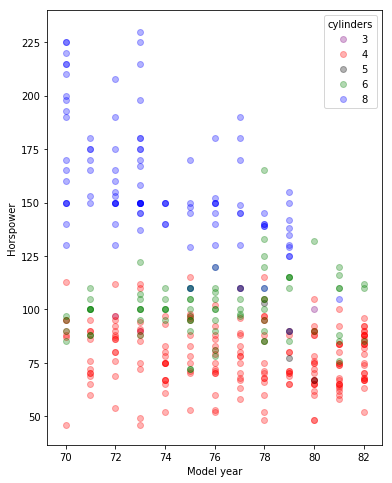

In [15]:
fig, ax = plt.subplots(figsize=(6,8))
color_map = dict(zip(cars.cylinders.unique(),
                     ['blue', 'green', 'red', 'purple', 'black']))
for cylinders, group in cars.groupby('cylinders'):
    plt.scatter(group['model_year'], group['horsepower'],
                color=color_map[cylinders],
                alpha=0.3, edgecolor=None,
                label=cylinders)
plt.legend(frameon=True, title='cylinders')
plt.xlabel('Model year')
plt.ylabel('Horspower');

### Pandas
Description:
- Based on matplotlib
- Built within the pandas DataFrame library
- Simple API for plotting
- Recently added more sophisticated statictical visualisation tools (e.g. andrews_curves)

Strengths and Weaknesses:
- Strengths
    - Quick and dirty for simple plots
- Weaknesses
    - Not easy to groupby/color/facet
    
Doc: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html

**Imports**

In [9]:
import pandas as pd

**Basic plots**

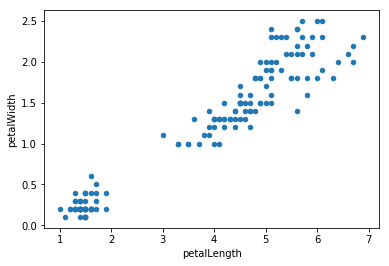

In [11]:
# PANDAS - Scatter plot
iris.plot.scatter(x='petalLength', y='petalWidth');

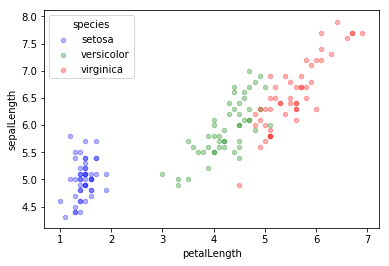

In [17]:
# PANDAS - Scatter plot by group
fig, ax = plt.subplots(figsize=(6,4))
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
for species, group in iris.groupby('species'):
    group.plot.scatter('petalLength', 'sepalLength',
                       color=color_map[species],
                       alpha=0.3, edgecolor=None,
                       label=species, ax = ax)
plt.legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength');

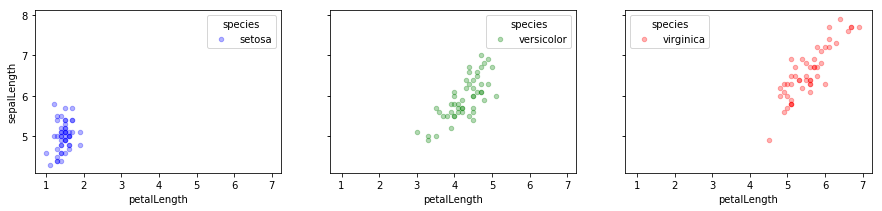

In [18]:
# PANDAS - Clean - Scatter plot by group with facets
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
n_panels = len(color_map)
fig, ax = plt.subplots(1, n_panels, figsize=(n_panels * 5, 3),
                       sharex=True, sharey=True)
for i, (species, group) in enumerate(iris.groupby('species')):
    group.plot.scatter('petalLength', 'sepalLength',
                       color=color_map[species],
                       alpha=0.3, edgecolor=None,
                       label=species,
                       ax = ax[i])
    ax[i].legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength');

**Aesthetics**

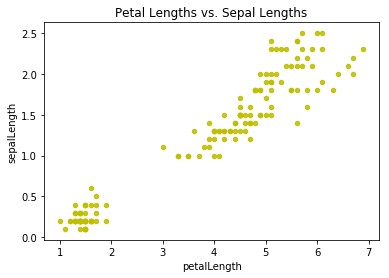

In [19]:
# PANDAS - Scatter plot
fig, ax = plt.subplots(figsize=(6,4))
iris.plot.scatter(x = 'petalLength', y = 'petalWidth', alpha = 0.9, ax = ax, c='y')
plt.xlabel('petalLength')
plt.ylabel('sepalLength')
plt.title('Petal Lengths vs. Sepal Lengths');

**Other plots**

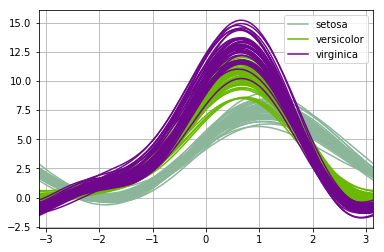

In [20]:
# PANDAS - Other statistical tool
pd.plotting.andrews_curves(iris, 'species');

**Exercise 1**

Plot, in one line, acceleration vs. horsepower.

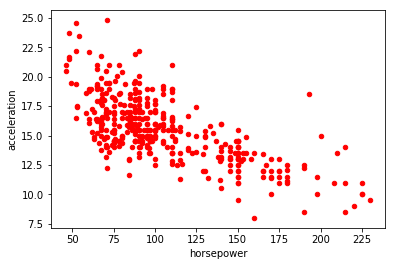

In [21]:
cars.plot.scatter('horsepower', 'acceleration', c='r');

### Seaborn
Description:
- Extends on matplotlib
- Focus on statistical visualisation and modeling
- Towards declarative programming

Strengths and Weaknesses:
- Strengths
    - Allows working with DataFrames
    - Nice statistical tools
    - High-level programming
    - Nice color palettes and styles
    - Well documented and widely used
- Weaknesses
    - Not general

<img src='images/seaborn.PNG'>

doc: https://seaborn.pydata.org/api.html

**Imports**

In [25]:
# # libraries
# !pip install seaborn

In [14]:
# imports
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

**Basic plots**

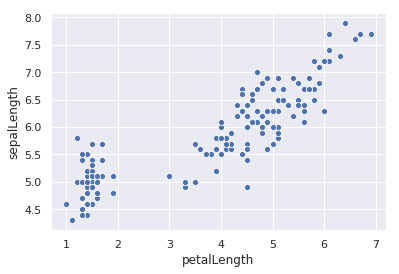

In [15]:
# SEABORN - Scatter plot
ax = sns.scatterplot(x="petalLength", y="sepalLength", data=iris)

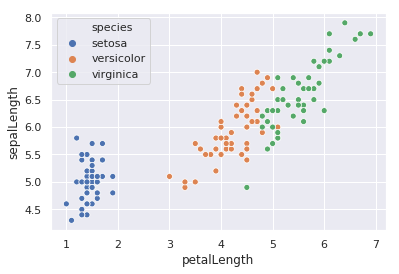

In [24]:
# SEABORN - Scatter plot by group
ax = sns.scatterplot(x='petalLength', y='sepalLength', hue='species', data=iris)

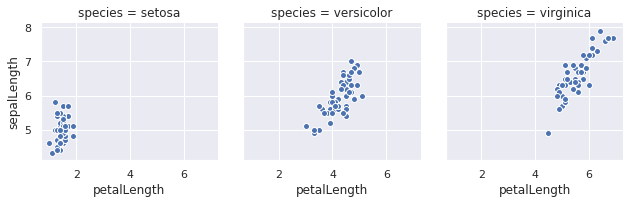

In [27]:
# SEABORN - Scatter plot by group with facets
g = sns.FacetGrid(iris, col="species")
g = g.map(plt.scatter, "petalLength", "sepalLength", edgecolor="w")

**Aesthetics**

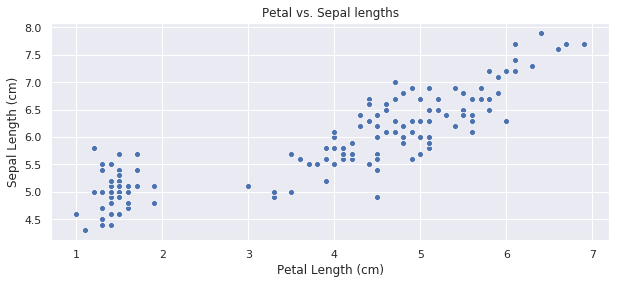

In [16]:
# SEABORN - Aesthetics
fig, ax = plt.subplots(figsize=(10,4))
plt.title('Petal vs. Sepal lengths')

ax = sns.scatterplot(x="petalLength", y="sepalLength", data=iris)

plt.xlabel('Petal Length (cm)')
plt.ylabel('Sepal Length (cm)');

**Other plots**

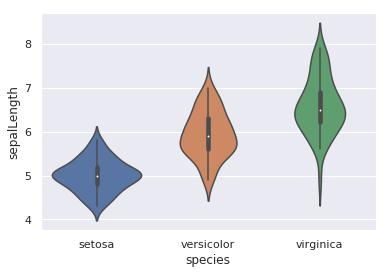

In [31]:
# SEABORN - Violin plots
fig, ax = plt.subplots(figsize=(6,4))
ax = sns.violinplot(x="species", y="sepalLength", data=iris)

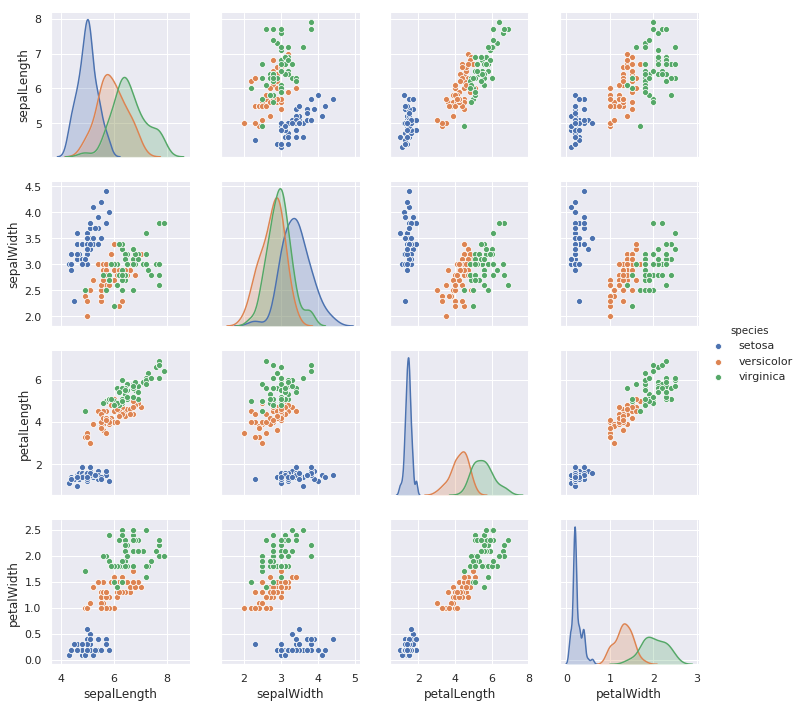

In [32]:
# SEABORN - Other statistical tools
ax = sns.pairplot(hue='species', data=iris)

**Exercise: Cars**

Make a pairplot of all the variables in cars with regard to origin country.

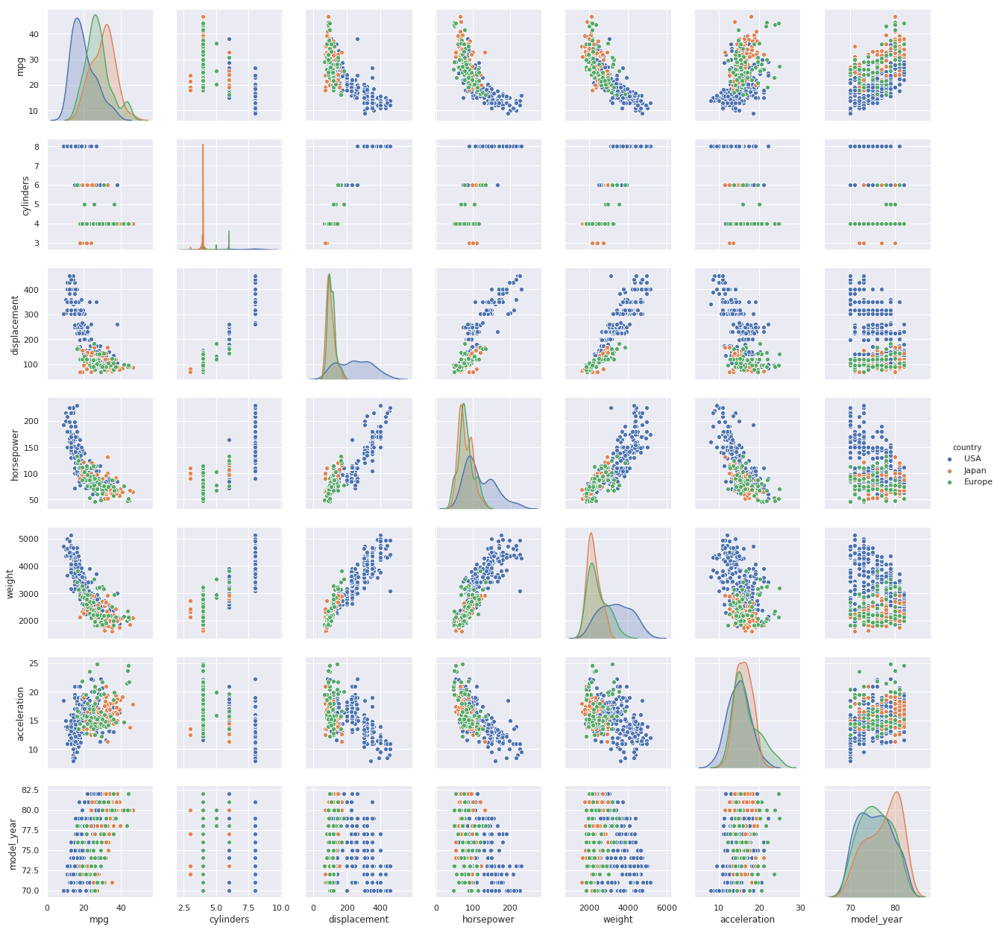

In [39]:
sns.pairplot(cars, hue = 'country');

**Exercise: Cars**

Plot the weight vs horsepower and add a linear regression along the points.

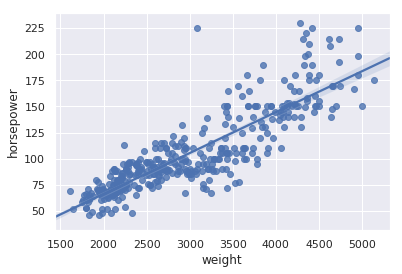

In [31]:
ax = sns.regplot(x="weight", y="horsepower", data=cars)

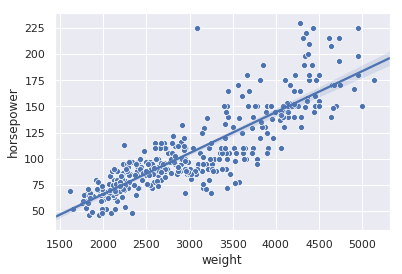

In [39]:
fig, ax = plt.subplots()
sns.scatterplot(x="weight", y="horsepower", data=cars, ax=ax)
sns.regplot(x="weight", y="horsepower", data=cars, scatter=False, ax=ax);

**Exercise: Cars**

Build a bar plot with the count of rows per cylinder.

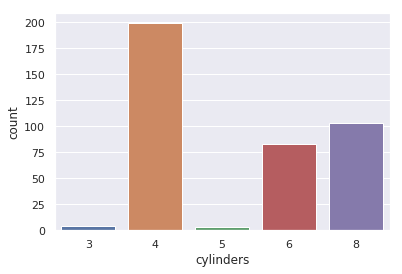

In [44]:
ax = sns.countplot(x="cylinders", data=cars)
# OR
# ax = sns.barplot(x="cylinders", y="mpg", data=cars, estimator=np.size)

**Exercise: Cars**

Build a bar plot with the average of horsepower per year.

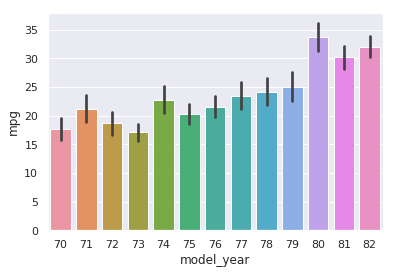

In [45]:
ax = sns.barplot(x="model_year", y="mpg", data=cars, estimator=np.mean)

**Exercise: Tips**

Build a violin plot showing the difference of total_bill between smoker/non-smoker by day.
tip: you can use ```split=True```

In [48]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


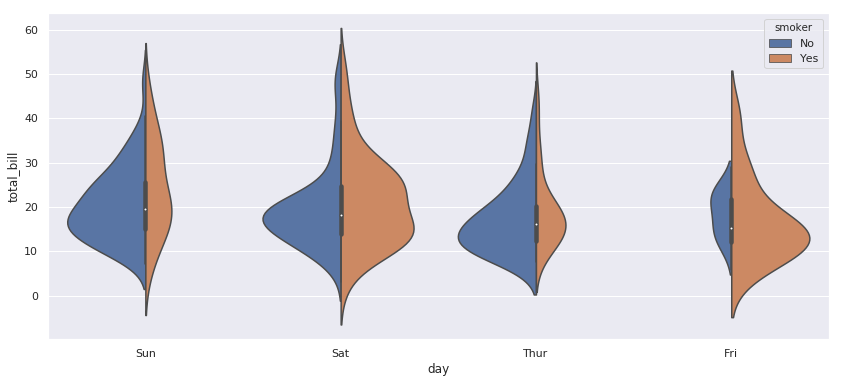

In [50]:
fig, ax = plt.subplots(figsize=(14,6))
ax = sns.violinplot(x="day", y="total_bill", hue="smoker", data=tips, split=True, scale='count')

### Plotnine
Description:
- Based on matplotlib
- Same calls as with the R package ggplot2

Strengths and Weaknesses:
- Strengths
    - No need to learn new package if you know ggplot2
- Weaknesses
    - Small community
    - Some quirks and bugs
    
<img src='images/plotnine.png'>

Doc: https://plotnine.readthedocs.io/en/stable/

**Imports**

In [34]:
# libraries
# !pip install plotnine

In [51]:
# imports
import plotnine as pn

**Basic plots**

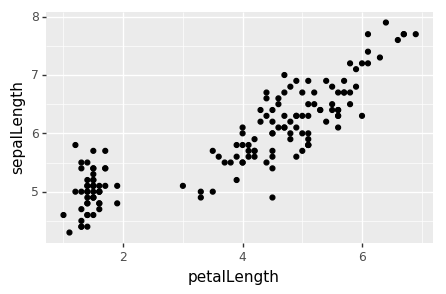

<ggplot: (8742318534527)>

In [50]:
# PLOTNINE - Scatter plot
(pn.ggplot(iris, pn.aes('petalLength', 'sepalLength'))
 + pn.geom_point()
 + pn.theme(figure_size=(5, 3)))

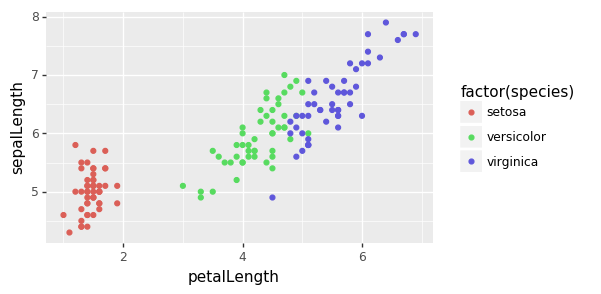

<ggplot: (8742318296524)>

In [51]:
# PLOTNINE - Scatter plot by group
(pn.ggplot(iris, pn.aes('petalLength', 'sepalLength', color='factor(species)'))
 + pn.geom_point()
 + pn.theme(figure_size=(5, 3)))

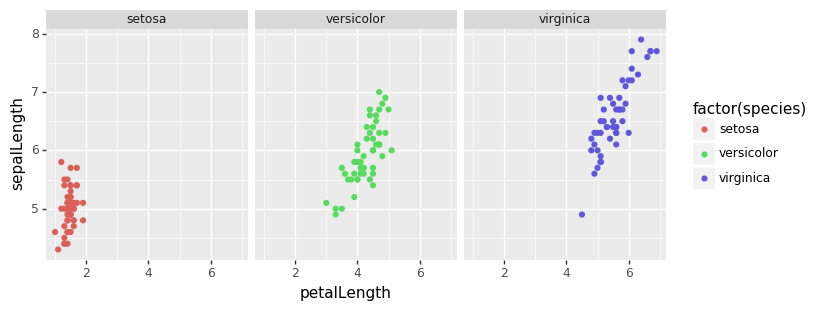

<ggplot: (-9223363294538852085)>

In [52]:
# PLOTNINE - Scatter plot by group with facets
(pn.ggplot(iris, pn.aes('petalLength', 'sepalLength', color='factor(species)'))
 + pn.geom_point()
 + pn.facet_wrap('~species')
 + pn.theme(figure_size=(8, 3)))

**Aesthetics**

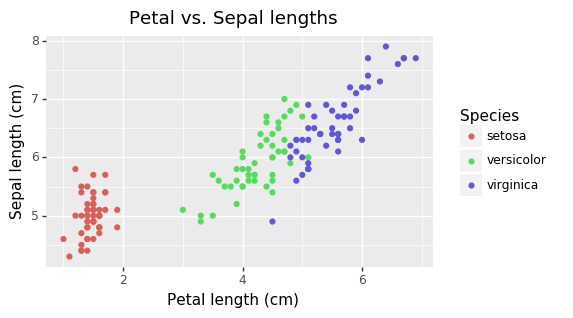

<ggplot: (-9223363294496450300)>

In [53]:
# PLOTNINE - Aesthetics
(pn.ggplot(iris, pn.aes('petalLength', 'sepalLength', color='factor(species)'))
 + pn.geom_point()
 + pn.theme(figure_size=(5, 3))
 + pn.labs(x='Petal length (cm)', y='Sepal length (cm)', color='Species')
 + pn.ggtitle('Petal vs. Sepal lengths'))

**Other plots**

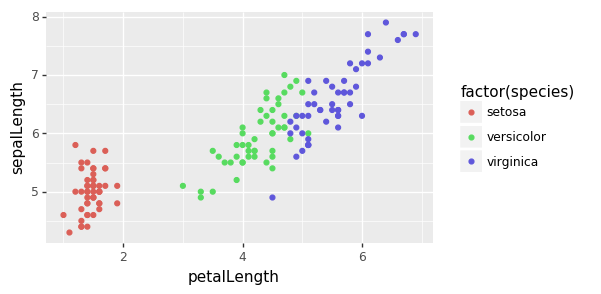

<ggplot: (8728711449387)>

In [53]:
# PLOTNINE - QPLOT - Quick plots
(pn.qplot(x='petalLength', y='sepalLength', data=iris, color='factor(species)') 
 + pn.theme(figure_size=(5, 3)))

**Exercise: Tips**

Scatter plot the total_bill vs tips by gender.

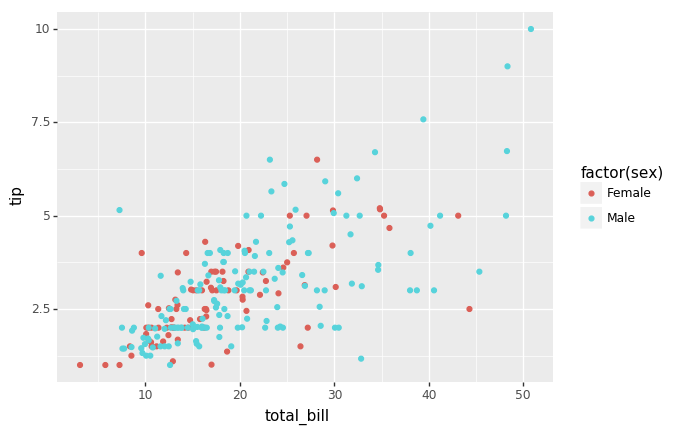

<ggplot: (8742358277496)>

In [55]:
(pn.ggplot(tips, pn.aes('total_bill', 'tip', color='factor(sex)'))
+ pn.geom_point())

## Interactive plots

### Plotly
Description:
- Interactive
- Online/offline visualization library with a Python API integration
- Can be easily embedded into websites

Strengths and Weaknesses:
- Strengths
    - Good default style characteristics
    - Multi-language support
    - 3D support
    - Animation capability
    - Geographical visualisation
- Weaknesses
    - Some features are paid
    
<img src='images/plotly.PNG'>

Doc: https://plot.ly/python/

**Imports**

In [42]:
# libraries
# !pip install plotly

In [54]:
# imports
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode #, download_plotlyjs, plot, iplot
init_notebook_mode(connected=True)

**Basic plots**

In [56]:
# PLOTLY - Scatter plot
trace = go.Scatter(x=iris.petalLength,
                   y=iris.sepalLength,
                   mode = 'markers')
data = [trace]

py.iplot(data)

# Instead of showing the plot, it saves it into an HTML page
# py.plot(data)

'temp-plot.html'

In [57]:
# PLOTLY - Scatter plot by group

# Not working on 3.8.0... Do the following and then restart
# import plotly
# plotly.__version__
# !pip uninstall plotly -y
# !pip install plotly==3.7.0 --user

trace = dict(
    type = 'scatter',
    mode = 'markers',
    x = iris['petalLength'],
    y = iris['sepalLength'],
    transforms = [
        dict(type = 'groupby',
             groups = iris['species'])])
data=[trace]

py.iplot({'data': data}, validate=False)

ValueError: Invalid property specified for object of type plotly.graph_objs.Scatter: 'transforms'

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on plot.ly for  customdata .
        dx
            Sets the x coordinate step. See `x0` for more info.
        dy
            Sets the y coordinate step. See `y0` for more info.
        error_x
            plotly.graph_objs.scatter.ErrorX instance or dict with
            compatible properties
        error_y
            plotly.graph_objs.scatter.ErrorY instance or dict with
            compatible properties
        fill
            Sets the area to fill with a solid color. Defaults to
            "none" unless this trace is stacked, then it gets
            "tonexty" ("tonextx") if `orientation` is "v" ("h") Use
            with `fillcolor` if not "none". "tozerox" and "tozeroy"
            fill to x=0 and y=0 respectively. "tonextx" and
            "tonexty" fill between the endpoints of this trace and
            the endpoints of the trace before it, connecting those
            endpoints with straight lines (to make a stacked area
            graph); if there is no trace before it, they behave
            like "tozerox" and "tozeroy". "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other. Traces in a `stackgroup` will only fill to (or
            be filled to) other traces in the same group. With
            multiple `stackgroup`s or some traces stacked and some
            not, if fill-linked traces are not already consecutive,
            the later ones will be pushed down in the drawing
            order.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        groupnorm
            Only relevant when `stackgroup` is used, and only the
            first `groupnorm` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the normalization for the sum of
            this `stackgroup`. With "fraction", the value of each
            trace at each location is divided by the sum of all
            trace values at that location. "percent" is the same
            but multiplied by 100 to show percentages. If there are
            multiple subplots, or multiple `stackgroup`s on one
            subplot, each will be normalized within its own set.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on plot.ly for  hoverinfo .
        hoverlabel
            plotly.graph_objs.scatter.Hoverlabel instance or dict
            with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}". See https://github.com/d3/d3-format
            /blob/master/README.md#locale_format for details on the
            formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plot.ly/javascript/plotlyjs-events/#event-data.
            Additionally, every attributes that can be specified
            per-point (the ones that are `arrayOk: true`) are
            available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on plot.ly for  hovertemplate
            .
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on plot.ly for  hovertext .
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on plot.ly for  ids .
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        line
            plotly.graph_objs.scatter.Line instance or dict with
            compatible properties
        marker
            plotly.graph_objs.scatter.Marker instance or dict with
            compatible properties
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        orientation
            Only relevant when `stackgroup` is used, and only the
            first `orientation` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the stacking direction. With "v"
            ("h"), the y (x) values of subsequent traces are added.
            Also affects the default value of `fill`.
        r
            r coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the radial
            coordinatesfor legacy polar chart only.
        rsrc
            Sets the source reference on plot.ly for  r .
        selected
            plotly.graph_objs.scatter.Selected instance or dict
            with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stackgaps
            Only relevant when `stackgroup` is used, and only the
            first `stackgaps` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Determines how we handle locations at
            which other traces in this group have data but this one
            does not. With *infer zero* we insert a zero at these
            locations. With "interpolate" we linearly interpolate
            between existing values, and extrapolate a constant
            beyond the existing values.
        stackgroup
            Set several scatter traces (on the same subplot) to the
            same stackgroup in order to add their y values (or
            their x values if `orientation` is "h"). If blank or
            omitted this trace will not be stacked. Stacking also
            turns `fill` on by default, using "tonexty" ("tonextx")
            if `orientation` is "h" ("v") and sets the default
            `mode` to "lines" irrespective of point count. You can
            only stack on a numeric (linear or log) axis. Traces in
            a `stackgroup` will only fill to (or be filled to)
            other traces in the same group. With multiple
            `stackgroup`s or some traces stacked and some not, if
            fill-linked traces are not already consecutive, the
            later ones will be pushed down in the drawing order.
        stream
            plotly.graph_objs.scatter.Stream instance or dict with
            compatible properties
        t
            t coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the
            angular coordinatesfor legacy polar chart only.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on plot.ly for  textposition
            .
        textsrc
            Sets the source reference on plot.ly for  text .
        tsrc
            Sets the source reference on plot.ly for  t .
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            plotly.graph_objs.scatter.Unselected instance or dict
            with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the x coordinates.
        x0
            Alternate to `x`. Builds a linear space of x
            coordinates. Use with `dx` where `x0` is the starting
            coordinate and `dx` the step.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xcalendar
            Sets the calendar system to use with `x` date data.
        xsrc
            Sets the source reference on plot.ly for  x .
        y
            Sets the y coordinates.
        y0
            Alternate to `y`. Builds a linear space of y
            coordinates. Use with `dy` where `y0` is the starting
            coordinate and `dy` the step.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ycalendar
            Sets the calendar system to use with `y` date data.
        ysrc
            Sets the source reference on plot.ly for  y .
        

In [58]:
# PLOTLY - Scatter plot by group (with pandas)
fig = go.Figure()
for species, group in iris.groupby('species'):
    fig.add_scatter(x=group.petalLength, y=group.sepalLength, name=species, mode='markers')

py.iplot(fig)

In [59]:
# PLOTLY - Scatter plot by group with facets
fig = ff.create_facet_grid(df = iris,
                           x='petalLength',
                           y='sepalLength',
                           facet_col='species',
                           color_name='species',
                           width = 900,
                           height = 400)
py.iplot(fig)

**Aesthetics**

In [61]:
# PLOTLY - Aesthetics - Scatter plot
trace = go.Scatter(x=iris.petalLength,
                   y=iris.sepalLength,
                   mode = 'markers')
data = [trace]


layout = dict(title = '<b>Iris</b><br>Petal lengths (cm) vs. Sepal lengths (cm)',
              yaxis = dict(title='Sepal length (cm)',
                           titlefont=dict(family='Courier New, monospace',
                                          size=18,
                                          color='#7f7f7f')),
              xaxis = dict(title='Sepal length (cm)',
                           titlefont=dict(family='Courier New, monospace',
                                          size=18,
                                          color='#7f7f7f')))

py.iplot({'data': data, 'layout': layout}, validate=False)

In [62]:
# PLOTLY - Aesthetics - Scatter plot by group (with pandas)
fig = go.Figure()
for species, group in iris.groupby('species'):
    fig.add_scatter(x=group.petalLength, y=group.sepalLength, name=species, mode='markers')

layout = dict(title = '<b>Iris</b><br>Petal lengths (cm) vs. Sepal lengths (cm)',
              yaxis = dict(title='Sepal length (cm)'),
              xaxis = dict(title='Sepal length (cm)'))

fig.layout = layout
py.iplot(fig)

**Other plots**

In [64]:
# PLOTLY - Scatter plot by group - aggregated
trace = dict(type = 'scatter',
             mode = 'markers',
             x = iris['petalLength'],
             y = iris['sepalLength'],
             text = iris['species'],
             opacity = 0.8,
             marker = dict(size = 10*iris['petalWidth']*iris['sepalWidth'],
                           sizemode = 'area',
                           sizeref = 10),
             transforms = [dict(type = 'aggregate',
                                groups = iris['species'],
                                aggregations = [
                                    dict(target = 'x', func = 'avg'),
                                    dict(target = 'y', func = 'avg'),
                                    dict(target = 'marker.size', func = 'sum')])])
data = [trace]

layout = dict(title = '<b>Iris</b><br>Petal lengths (cm) vs. Sepal lengths (cm)')


py.iplot({'data': data, 'layout': layout}, validate=False)

ValueError: Invalid property specified for object of type plotly.graph_objs.Scatter: 'transforms'

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on plot.ly for  customdata .
        dx
            Sets the x coordinate step. See `x0` for more info.
        dy
            Sets the y coordinate step. See `y0` for more info.
        error_x
            plotly.graph_objs.scatter.ErrorX instance or dict with
            compatible properties
        error_y
            plotly.graph_objs.scatter.ErrorY instance or dict with
            compatible properties
        fill
            Sets the area to fill with a solid color. Defaults to
            "none" unless this trace is stacked, then it gets
            "tonexty" ("tonextx") if `orientation` is "v" ("h") Use
            with `fillcolor` if not "none". "tozerox" and "tozeroy"
            fill to x=0 and y=0 respectively. "tonextx" and
            "tonexty" fill between the endpoints of this trace and
            the endpoints of the trace before it, connecting those
            endpoints with straight lines (to make a stacked area
            graph); if there is no trace before it, they behave
            like "tozerox" and "tozeroy". "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other. Traces in a `stackgroup` will only fill to (or
            be filled to) other traces in the same group. With
            multiple `stackgroup`s or some traces stacked and some
            not, if fill-linked traces are not already consecutive,
            the later ones will be pushed down in the drawing
            order.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        groupnorm
            Only relevant when `stackgroup` is used, and only the
            first `groupnorm` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the normalization for the sum of
            this `stackgroup`. With "fraction", the value of each
            trace at each location is divided by the sum of all
            trace values at that location. "percent" is the same
            but multiplied by 100 to show percentages. If there are
            multiple subplots, or multiple `stackgroup`s on one
            subplot, each will be normalized within its own set.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on plot.ly for  hoverinfo .
        hoverlabel
            plotly.graph_objs.scatter.Hoverlabel instance or dict
            with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}". See https://github.com/d3/d3-format
            /blob/master/README.md#locale_format for details on the
            formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plot.ly/javascript/plotlyjs-events/#event-data.
            Additionally, every attributes that can be specified
            per-point (the ones that are `arrayOk: true`) are
            available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on plot.ly for  hovertemplate
            .
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on plot.ly for  hovertext .
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on plot.ly for  ids .
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        line
            plotly.graph_objs.scatter.Line instance or dict with
            compatible properties
        marker
            plotly.graph_objs.scatter.Marker instance or dict with
            compatible properties
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        orientation
            Only relevant when `stackgroup` is used, and only the
            first `orientation` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the stacking direction. With "v"
            ("h"), the y (x) values of subsequent traces are added.
            Also affects the default value of `fill`.
        r
            r coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the radial
            coordinatesfor legacy polar chart only.
        rsrc
            Sets the source reference on plot.ly for  r .
        selected
            plotly.graph_objs.scatter.Selected instance or dict
            with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stackgaps
            Only relevant when `stackgroup` is used, and only the
            first `stackgaps` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Determines how we handle locations at
            which other traces in this group have data but this one
            does not. With *infer zero* we insert a zero at these
            locations. With "interpolate" we linearly interpolate
            between existing values, and extrapolate a constant
            beyond the existing values.
        stackgroup
            Set several scatter traces (on the same subplot) to the
            same stackgroup in order to add their y values (or
            their x values if `orientation` is "h"). If blank or
            omitted this trace will not be stacked. Stacking also
            turns `fill` on by default, using "tonexty" ("tonextx")
            if `orientation` is "h" ("v") and sets the default
            `mode` to "lines" irrespective of point count. You can
            only stack on a numeric (linear or log) axis. Traces in
            a `stackgroup` will only fill to (or be filled to)
            other traces in the same group. With multiple
            `stackgroup`s or some traces stacked and some not, if
            fill-linked traces are not already consecutive, the
            later ones will be pushed down in the drawing order.
        stream
            plotly.graph_objs.scatter.Stream instance or dict with
            compatible properties
        t
            t coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the
            angular coordinatesfor legacy polar chart only.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on plot.ly for  textposition
            .
        textsrc
            Sets the source reference on plot.ly for  text .
        tsrc
            Sets the source reference on plot.ly for  t .
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            plotly.graph_objs.scatter.Unselected instance or dict
            with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the x coordinates.
        x0
            Alternate to `x`. Builds a linear space of x
            coordinates. Use with `dx` where `x0` is the starting
            coordinate and `dx` the step.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xcalendar
            Sets the calendar system to use with `x` date data.
        xsrc
            Sets the source reference on plot.ly for  x .
        y
            Sets the y coordinates.
        y0
            Alternate to `y`. Builds a linear space of y
            coordinates. Use with `dy` where `y0` is the starting
            coordinate and `dy` the step.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ycalendar
            Sets the calendar system to use with `y` date data.
        ysrc
            Sets the source reference on plot.ly for  y .
        

In [65]:
# PLOTLY - Scatter plot - using MATPLOTLIB
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(6,4)) 
ax.scatter(iris['petalLength'], iris['sepalLength'], alpha=0.3)

plotly_fig = tls.mpl_to_plotly(fig)
py.iplot(plotly_fig)

In [66]:
# PLOTLY - Scatter plot - using SEABORN
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

fig, ax = plt.subplots()
ax = sns.scatterplot(x="petalLength", y="sepalLength", data=iris, alpha=0.5, edgecolor = 'b')
ax.set_ylabel('') # gives a warning otherwise 
ax.set_xlabel('') # gives a warning otherwise

plotly_fig = tls.mpl_to_plotly(fig)
py.iplot(plotly_fig)

In [67]:
# PLOTLY - Interactions and superpositions
trace_0 = dict(type = 'scatter',
             mode = 'markers',
             marker = dict(size = 10*iris['sepalLength'],
                           sizemode = 'area',
                           sizeref = 10),
             x = iris['petalLength'],
             y = iris['sepalLength'],
             transforms = [dict(type = 'groupby',
                                groups = iris['species']),
                           dict(type = 'aggregate',
                                groups = iris['species'],
                                aggregations = [dict(target = 'x', func = 'avg'),
                                                dict(target = 'y', func = 'avg'),
                                                dict(target = 'marker.size', func = 'sum')])])
trace_1 = dict(type = 'scatter',
               mode = 'markers',
               x = iris['petalLength'],
               y = iris['sepalLength'],
               transforms = [dict(type = 'filter',
                                  target = iris['species'],
                                  orientation = '=',
                                  value = iris['species'].unique()[0])])
trace_2 = dict(type = 'scatter',
               mode = 'markers',
               x = iris['petalLength'],
               y = iris['sepalLength'],
               transforms = [dict(type = 'filter',
                                  target = iris['species'],
                                  orientation = '=',
                                  value = iris['species'].unique()[1])])
trace_3 = dict(type = 'scatter',
               mode = 'markers',
               x = iris['petalLength'],
               y = iris['sepalLength'],
               transforms = [dict(type = 'filter',
                                  target = iris['species'],
                                  orientation = '=',
                                  value = iris['species'].unique()[2])])
data = [trace_0, trace_1, trace_2, trace_3]

layout = dict(title = '<b>Iris</b><br>Petal lengths (cm) vs. Sepal lengths (cm)',
              yaxis = dict(title='Sepal length (cm)',
                           titlefont=dict(family='Courier New, monospace',
                                          size=18,
                                          color='#7f7f7f')),
              xaxis = dict(title='Sepal length (cm)',
                           titlefont=dict(family='Courier New, monospace',
                                          size=18,
                                          color='#7f7f7f')),
              updatemenus = list([dict(buttons=list([dict(args=[{'visible': [True, True, True, True]}],
                                                          label='All',
                                                          method='update'),
                                                     dict(args=[{'visible': [False, True, False, False]}],
                                                          label='First species',
                                                          method='update'),
                                                     dict(args=[{'visible': [False, False, True, False]}],
                                                          label='Second species',
                                                          method='update'),
                                                     dict(args=[{'visible': [False, False, False, True]}],
                                                          label='Third species',
                                                          method='update')]),
                                       direction = 'down')]))

py.iplot({'data': data, 'layout': layout}, validate=False)

ValueError: Invalid property specified for object of type plotly.graph_objs.Scatter: 'transforms'

    Valid properties:
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on plot.ly for  customdata .
        dx
            Sets the x coordinate step. See `x0` for more info.
        dy
            Sets the y coordinate step. See `y0` for more info.
        error_x
            plotly.graph_objs.scatter.ErrorX instance or dict with
            compatible properties
        error_y
            plotly.graph_objs.scatter.ErrorY instance or dict with
            compatible properties
        fill
            Sets the area to fill with a solid color. Defaults to
            "none" unless this trace is stacked, then it gets
            "tonexty" ("tonextx") if `orientation` is "v" ("h") Use
            with `fillcolor` if not "none". "tozerox" and "tozeroy"
            fill to x=0 and y=0 respectively. "tonextx" and
            "tonexty" fill between the endpoints of this trace and
            the endpoints of the trace before it, connecting those
            endpoints with straight lines (to make a stacked area
            graph); if there is no trace before it, they behave
            like "tozerox" and "tozeroy". "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other. Traces in a `stackgroup` will only fill to (or
            be filled to) other traces in the same group. With
            multiple `stackgroup`s or some traces stacked and some
            not, if fill-linked traces are not already consecutive,
            the later ones will be pushed down in the drawing
            order.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        groupnorm
            Only relevant when `stackgroup` is used, and only the
            first `groupnorm` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the normalization for the sum of
            this `stackgroup`. With "fraction", the value of each
            trace at each location is divided by the sum of all
            trace values at that location. "percent" is the same
            but multiplied by 100 to show percentages. If there are
            multiple subplots, or multiple `stackgroup`s on one
            subplot, each will be normalized within its own set.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on plot.ly for  hoverinfo .
        hoverlabel
            plotly.graph_objs.scatter.Hoverlabel instance or dict
            with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}". See https://github.com/d3/d3-format
            /blob/master/README.md#locale_format for details on the
            formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plot.ly/javascript/plotlyjs-events/#event-data.
            Additionally, every attributes that can be specified
            per-point (the ones that are `arrayOk: true`) are
            available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on plot.ly for  hovertemplate
            .
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on plot.ly for  hovertext .
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on plot.ly for  ids .
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        line
            plotly.graph_objs.scatter.Line instance or dict with
            compatible properties
        marker
            plotly.graph_objs.scatter.Marker instance or dict with
            compatible properties
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        orientation
            Only relevant when `stackgroup` is used, and only the
            first `orientation` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the stacking direction. With "v"
            ("h"), the y (x) values of subsequent traces are added.
            Also affects the default value of `fill`.
        r
            r coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the radial
            coordinatesfor legacy polar chart only.
        rsrc
            Sets the source reference on plot.ly for  r .
        selected
            plotly.graph_objs.scatter.Selected instance or dict
            with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stackgaps
            Only relevant when `stackgroup` is used, and only the
            first `stackgaps` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Determines how we handle locations at
            which other traces in this group have data but this one
            does not. With *infer zero* we insert a zero at these
            locations. With "interpolate" we linearly interpolate
            between existing values, and extrapolate a constant
            beyond the existing values.
        stackgroup
            Set several scatter traces (on the same subplot) to the
            same stackgroup in order to add their y values (or
            their x values if `orientation` is "h"). If blank or
            omitted this trace will not be stacked. Stacking also
            turns `fill` on by default, using "tonexty" ("tonextx")
            if `orientation` is "h" ("v") and sets the default
            `mode` to "lines" irrespective of point count. You can
            only stack on a numeric (linear or log) axis. Traces in
            a `stackgroup` will only fill to (or be filled to)
            other traces in the same group. With multiple
            `stackgroup`s or some traces stacked and some not, if
            fill-linked traces are not already consecutive, the
            later ones will be pushed down in the drawing order.
        stream
            plotly.graph_objs.scatter.Stream instance or dict with
            compatible properties
        t
            t coordinates in scatter traces are deprecated!Please
            switch to the "scatterpolar" trace type.Sets the
            angular coordinatesfor legacy polar chart only.
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on plot.ly for  textposition
            .
        textsrc
            Sets the source reference on plot.ly for  text .
        tsrc
            Sets the source reference on plot.ly for  t .
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            plotly.graph_objs.scatter.Unselected instance or dict
            with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the x coordinates.
        x0
            Alternate to `x`. Builds a linear space of x
            coordinates. Use with `dx` where `x0` is the starting
            coordinate and `dx` the step.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xcalendar
            Sets the calendar system to use with `x` date data.
        xsrc
            Sets the source reference on plot.ly for  x .
        y
            Sets the y coordinates.
        y0
            Alternate to `y`. Builds a linear space of y
            coordinates. Use with `dy` where `y0` is the starting
            coordinate and `dy` the step.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ycalendar
            Sets the calendar system to use with `y` date data.
        ysrc
            Sets the source reference on plot.ly for  y .
        

In [20]:
# PLOTLY - Interactions - 3D plots
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv')

data = [go.Surface(z=df.values.tolist(), colorscale='Viridis')]

layout = go.Layout(
    width=800,
    height=900,
    autosize=False,
    margin=dict(t=0, b=0, l=0, r=0),
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230, 230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        aspectratio = dict(x=1, y=1, z=0.7),
        aspectmode = 'manual'
    )
)

updatemenus=list([
    dict(
        buttons=list([   
            dict(
                args=['type', 'surface'],
                label='3D Surface',
                method='restyle'
            ),
            dict(
                args=['type', 'heatmap'],
                label='Heatmap',
                method='restyle'
            )             
        ]),
        direction = 'down',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.1,
        xanchor = 'left',
        y = 1.1,
        yanchor = 'top' 
    ),
])

annotations = list([
    dict(text='Trace type:', x=0, y=1.085, yref='paper', align='left', showarrow=False)
])
layout['updatemenus'] = updatemenus
layout['annotations'] = annotations

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='cmocean-picker-one-dropdown')

**Exercise: Cars**

Build a scatter plot of displacement vs weight.

In [70]:
trace = dict(
    type = 'scatter',
    mode = 'markers',
    x = cars['displacement'],
    y = cars['weight'])

data = [trace]
py.iplot(dict(data=data), validate=False)

**Exercise: Cars**

On top of the previous graph, plot the same points but aggregated by average.

In [22]:
trace_0 = dict(
    type = 'scatter',
    mode = 'markers',
    x = cars['displacement'],
    y = cars['weight'],
    transforms = [
        dict(type = 'groupby',
             groups = cars['cylinders'])])
trace_1 = dict(
    type = 'scatter',
    mode = 'markers',
    marker = dict(size = cars['mpg'],
                  sizemode = 'area',
                  sizeref = 7),
    x = cars['displacement'],
    y = cars['weight'],
    transforms = [
        dict(type = 'groupby',
             groups = cars['cylinders']),
        dict(type = 'aggregate',
             groups = cars['cylinders'],
             aggregations = [
                 dict(target = 'x', func = 'avg'),
                 dict(target = 'y', func = 'avg'),
                 dict(target = 'marker.size', func = 'sum')])])
data = [trace_0, trace_1]
py.iplot(dict(data=data), validate=False)

### Plotly Express
Description:
- high-level Python visualization library
- Wrapper for Plotly.py
- Inspired by Seaborn and ggplot2
- Compatible with Dash and Plotly

Strengths and Weaknesses:
- Strengths
    - Intuitive
- Weaknesses
    - Early stage

Doc: https://www.plotly.express/

**Imports**

In [73]:
# # libraries
# !pip install plotly-express

In [13]:
# !pip uninstall plotly -y
# !pip install plotly==3.8.0

In [72]:
# imports
import plotly_express as px

**Basic plots**

In [80]:
# PLOTLY EXPRESS - Scatter plot
px.scatter(iris, x="petalLength", y="sepalLength")

In [10]:
# PLOTLY EXPRESS - Scatter plot
px.scatter(iris, x="petalLength", y="sepalLength", color='species')

In [11]:
# PLOTLY EXPRESS - Scatter plot
px.scatter(iris, x="petalLength", y="sepalLength", facet_col='species', color='species')

**Aesthetics plots**

In [12]:
px.scatter(iris, x="petalLength", y="sepalLength", color='species', 
           title = 'Petal vs Sepal lengths (cm)', 
           labels = dict(sepalLength='Sepal Length (cm)',
                         petalLength='Petal Length (cm)'))

**Other plots**

In [75]:
gapminder = px.data.gapminder()
px.scatter(gapminder, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country", facet_col="continent",
           log_x=True, size_max=45, range_x=[100,100000], range_y=[25,90])

**Exercise: Tips**

Plot the points of total_bill vs. tip by color day.

In [81]:
px.scatter(tips, x='total_bill', y='tip', color='day', hover_name='size')

**Exercise: Tips**

Plot the points of total_bill vs. tip by color time, with an animation by day and the size of the points by size. If you want, you can also facet by smoker.

In [17]:
px.scatter(tips, x="total_bill", y="tip", animation_frame="day", size="size", color="time")

### Altair
Description:
- Fully declarative visualisation
- Passes around data and visualisation specifications
- Documentation can be found on Altair and Vega-Lite as it is very similar

Strengths and Weaknesses:
- Strengths
    - Intuitive
    - Code is concise
    - Altair is under heavy development
- Weaknesses
    - Not well suited for large datasets
    
<img src='images/altair.png'>

Doc: https://altair-viz.github.io/

**Imports**

In [52]:
# libraries
# !pip install vega==1.3
# !pip install vega_datasets
# !pip install altair

In [82]:
# imports
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

**Basic plots**

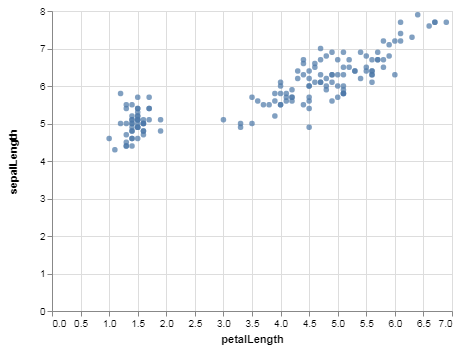

In [87]:
# ALTAIR - Scatter plot - Interactive
alt.Chart(iris).mark_circle().encode(
    x='petalLength', 
    y='sepalLength'
).interactive()

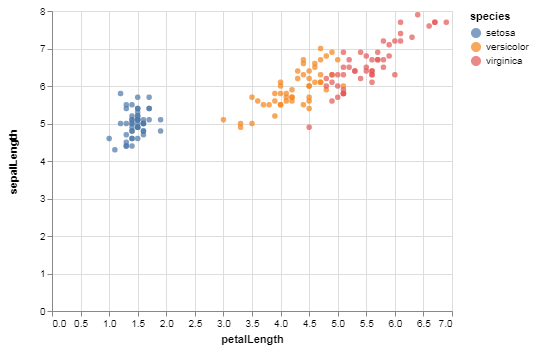

In [88]:
# ALTAIR - Scatter plot by group
alt.Chart(iris).mark_circle().encode(
    x='petalLength', 
    y='sepalLength', 
    color='species'
).interactive()

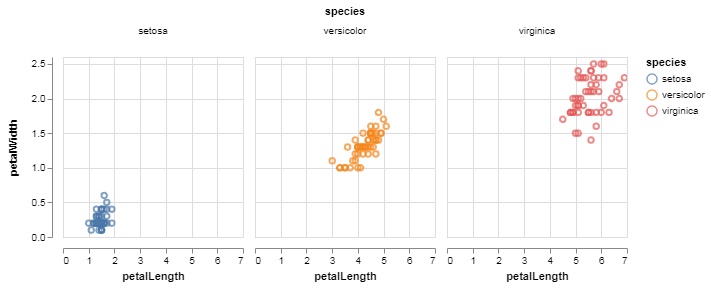

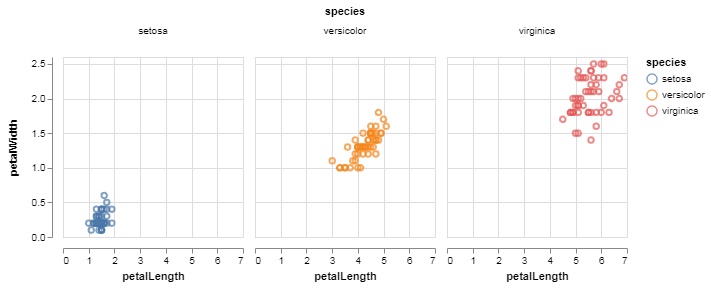

In [12]:
# ALTAIR - Scatter plot by group with facets
alt.Chart(iris).mark_point().encode(
    x='petalLength:Q',
    y='petalWidth:Q',
    color='species:N'
).properties(
    width=180,
    height=180
).facet(
    column='species:N'
).interactive()

**Aesthetics plots**

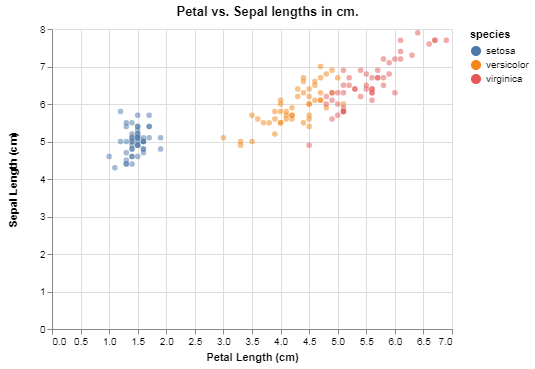

In [90]:
alt.Chart(iris).mark_circle().encode(
    x = alt.X('petalLength', axis=alt.Axis(title='Petal Length (cm)')), 
    y = alt.Y('sepalLength', axis=alt.Axis(title='Sepal Length (cm)')), 
    color = 'species'
).configure_mark(
    opacity=0.5
).properties(
    title='Petal vs. Sepal lengths in cm.'
).interactive()

**Other plots**

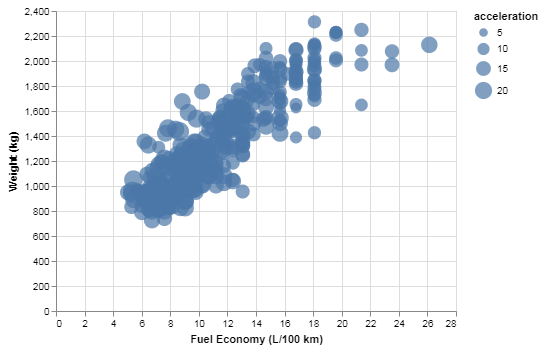

In [92]:
# ALTAIR - Add tranformation to data
import altair as alt

alt.Chart(cars).mark_circle(
).transform_filter(
    alt.expr.datum.mpg > 0
).transform_calculate(
    'Fuel Economy (L/100 km)', '235.2 / datum.mpg'
).transform_calculate(
    'Weight (kg)', 'datum.weight * 0.45'
).encode(
    x='Fuel Economy (L/100 km):Q',
    y='Weight (kg):Q',
    size='acceleration:Q'
)

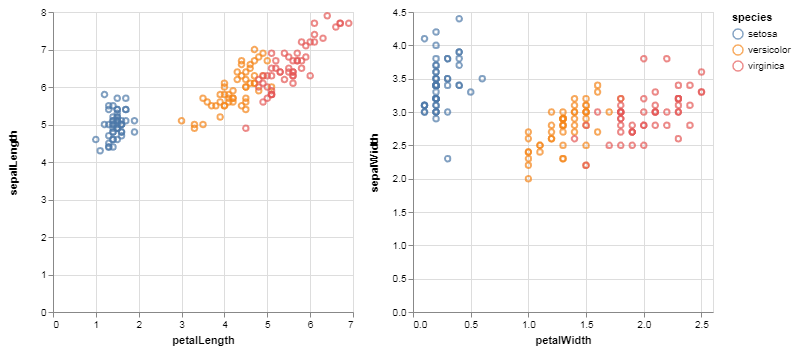

In [95]:
# ALTAIR - Scatter plots - Interactions
brush = alt.selection(type='interval', resolve='global')

base = alt.Chart(iris).mark_point().encode(
    color=alt.condition(brush, 'species', alt.ColorValue('gray'))
).add_selection(
    brush
).properties(
    width=300,
    height=300
)#.interactive()

chart_0 = base.encode(x='petalLength:Q', y='sepalLength:Q')
chart_1 = base.encode(x='petalWidth:Q', y='sepalWidth:Q')
chart_0 | chart_1

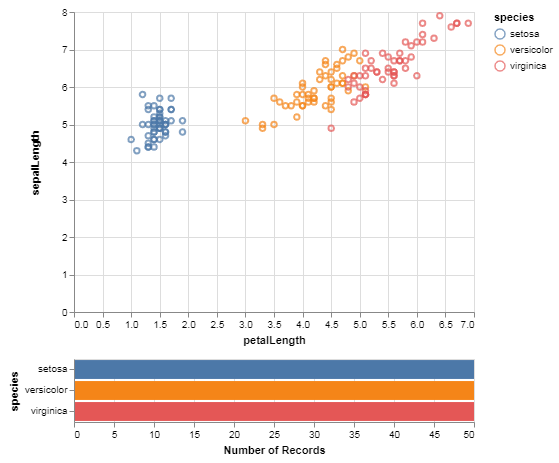

In [96]:
# ALTAIR - Scatter/bar chart - Interactions
brush = alt.selection(type='interval')

points = alt.Chart().mark_point().encode(
    x='petalLength:Q',
    y='sepalLength:Q',
    color=alt.condition(brush, 'species:N', alt.value('lightgray'))
).add_selection(
    brush
)

bars = alt.Chart().mark_bar().encode(
    y='species:N',
    color='species:N',
    x='count(species):Q'
).transform_filter(
    brush
)

alt.vconcat(points, bars, data=iris)

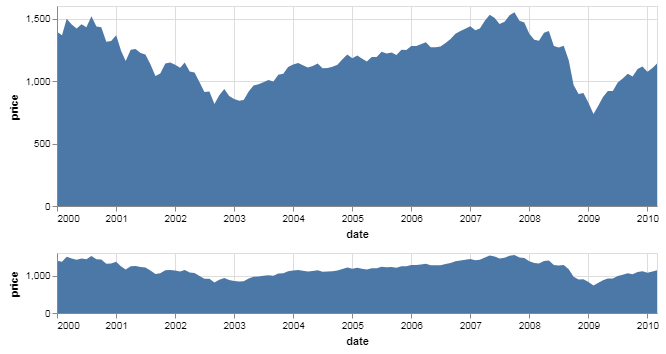

In [97]:
from vega_datasets import data
sp500 = pd.read_csv(data.sp500.url)

brush = alt.selection(type='interval', encodings=['x'])

upper = alt.Chart(sp500).mark_area().encode(
    x=alt.X('date:T', scale = {'domain': brush.ref()}),
    y='price:Q'
).properties(
    width=600,
    height=200
)

lower = upper.properties(
    height=60
).add_selection(brush)

alt.vconcat(upper, lower)

**Exercise: Tips**

Do a scatter plot of the total_bill vs tip and group by day of week. 

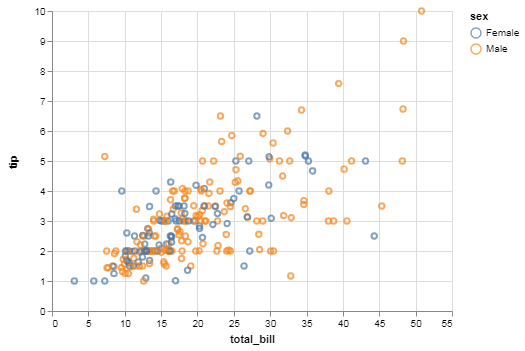

In [98]:
alt.Chart(tips).mark_point().encode(
    x='total_bill:Q',
    y='tip:Q',
    color='sex:N'
)

**Exercise: Tips**

To the previous plot, add a bar chart of count by gender next to it and make the selection from the scatter plot to the bar chart interactive.

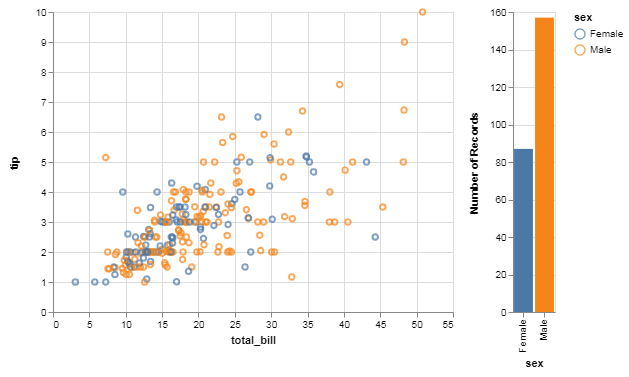

In [99]:
brush = alt.selection(type='interval')

scatter = alt.Chart(tips).mark_point().encode(
    x='total_bill:Q',
    y='tip:Q',
    color='sex:N'
).add_selection(
    brush
)

bar = alt.Chart(tips).mark_bar().encode(
    x='sex:N',
    y='count():Q',
    color='sex:N'
).transform_filter(
    brush
)

scatter | bar

### Bokeh
Description:
- Model objects are created in Python
- Then converted to a JSON format that is consumed by the client library, BokehJS
- Standalone HTML documents, or server-backed apps
- Easy usage from python (or Scala, or R, or...)

Strengths and Weaknesses:
- Strengths
    - Handles large datasets
    - Multi-language support
- Weaknesses
    - Still a bit imperative: requires long sepcifications -> which leads us to Holoviews
    - No vector output
    
<img src='images/bokeh.png'>

Doc: https://bokeh.pydata.org/en/latest/

**Imports**

In [61]:
# libraries
# !pip install bokeh

In [101]:
# imports
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource
output_notebook()

Loading BokehJS ...

**Basic plots**

In [102]:
# BOKEH - Scatter plot
source = ColumnDataSource(data=iris)

p = figure(plot_width=400, plot_height=300)
p.circle(x='petalLength', y='sepalLength', source=source, size = 8, fill_alpha=0.5)

show(p)

In [108]:
# BOKEH - Scatter plot - directly with pandas

p = figure(plot_width=400, plot_height=300)
p.circle(x='petalLength', y='sepalLength', source=iris, size = 8, fill_alpha=0.5)

show(p)

In [110]:
# BOKEH - Scatter plot by group
from bokeh.transform import factor_cmap

source = ColumnDataSource(data=iris)

p = figure(plot_width=400, plot_height=300, title = "Petal Lengths vs. Sepal Lengths (cm)")
p.scatter('petalLength', 'sepalLength', source=source, legend="species", fill_alpha=0.4, size=8,
          color=factor_cmap('species', 'Category10_3', iris.species.unique()))
p.legend.location = "top_left"
show(p)

In [112]:
# BOKEH - Scatter plot by group with facets
from bokeh.layouts import row

s_0 = figure(plot_width=200, plot_height=200, title=None)
s_0.circle(iris.petalLength, iris.sepalLength, size=5, color="navy", alpha=0.5)

p = [s_0]
for species, group in iris.groupby('species'):
    # by sharing the same ranges, we also share the panning with all plots
    s = figure(plot_width=200, plot_height=200, title=None, x_range=s_0.x_range, y_range=s_0.y_range)
    s.circle(group.petalLength, group.sepalLength, size=5, color="navy", alpha=0.5)
    p.append(s)

show(row(p))

**Aesthetics plots**

In [113]:
# BOKEH - Scatter plot
p = figure(plot_width=400, plot_height=400, title='Petal vs. Sepal lengths (cm)')

p.circle(iris.petalLength, iris.sepalLength, size = 7, fill_alpha=0.5)

p.xaxis.axis_label = "Petal Lengths (cm)"
p.yaxis.axis_label = "Sepal Lengths (cm)"

show(p)

**Other plots**

In [114]:
# BOKEH - Interactions - Linking plots
from bokeh.layouts import gridplot

# has to be used for interactions
source = ColumnDataSource(data=iris)

tools = ["box_select", "hover", "reset"]

p_0 = figure(plot_height=300, plot_width=300, tools=tools)
p_0.circle(x="petalLength", y="sepalLength", size=8, hover_color="red", source=source, alpha=0.6,
           color=factor_cmap('species', 'Category10_3', iris.species.unique()), nonselection_color = 'gray')

p_1 = figure(plot_height=300, plot_width=300, tools=tools)
p_1.circle(x="petalWidth", y="sepalWidth", size=8, hover_color="red", source=source, alpha=0.6,
           color=factor_cmap('species', 'Category10_3', iris.species.unique()), nonselection_color = 'gray')

show(gridplot([[p_0, p_1]]))

In [104]:
# BOKEH - Interactions - Interactive legends
from bokeh.palettes import Spectral4
from bokeh.layouts import row

p = figure(plot_width=400, plot_height=400, title=None)
for (species, group), color in zip(iris.groupby('species'), Spectral4):
    p.circle(group.petalLength, group.sepalLength, size=5, color=color, legend=species)

p.legend.location = "top_left"
p.legend.click_policy="hide" 

show(row(p))

In [115]:
# BOKEH - Widgets
from bokeh.io import output_file, show
from bokeh.layouts import widgetbox
from bokeh.models.widgets import CheckboxGroup

output_file("checkbox_group.html")

checkbox_group = CheckboxGroup(
    labels=["Option 1", "Option 2", "Option 3"], active=[0, 1, 2])

show(widgetbox(checkbox_group))

In [116]:
# BOKEH - Interactions - Adding widgets (using JavaScript Callbacks)
# (Widgets can either work with JavascriptCcallbacks or with Bokeh Server)
from bokeh.layouts import column
from bokeh.models import CustomJS, ColumnDataSource, Slider
from bokeh.plotting import Figure, output_file, show

output_file("js_on_change.html")

x = [x*0.005 for x in range(0, 200)]
y = x

source = ColumnDataSource(data=dict(x=x, y=y))

plot = Figure(plot_width=400, plot_height=400)
plot.line('x', 'y', source=source, line_width=3, line_alpha=0.6)

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var f = cb_obj.value
    var x = data['x']
    var y = data['y']
    for (var i = 0; i < x.length; i++) {
        y[i] = Math.pow(x[i], f)
    }
    source.change.emit();
""")

slider = Slider(start=0.1, end=4, value=1, step=.1, title="power")
slider.js_on_change('value', callback)

layout = column(slider, plot)

show(layout)

**Exercise: Cars**

Scatter plot mpg vs horsepower by country.

In [131]:
from bokeh.transform import factor_cmap

source = ColumnDataSource(data=cars)
p = figure(plot_width=400, plot_height=300)
p.scatter('horsepower', 'mpg', source=source, legend='country',
          color=factor_cmap('country', 'Category10_3', cars.country.unique()))
show(p)

**Exercise: Cars**

Scatter plot:
- mpg vs horsepower by country
- mpg vs model_year by country 

and make the selection between the two plots interactive.

In [46]:
from bokeh.layouts import gridplot

# has to be used for interactions
source = ColumnDataSource(data=cars)

tools = ["box_select", "hover", "reset"]

p_0 = figure(plot_height=300, plot_width=300, tools=tools)
p_0.circle(x="horsepower", y="mpg", size=8, hover_color="red", source=source, alpha=0.6,
           color=factor_cmap('country', 'Category10_3', cars.country.unique()), nonselection_color = 'gray')
p_0.xaxis.axis_label = "horsepower"
p_0.yaxis.axis_label = "mpg"

p_1 = figure(plot_height=300, plot_width=300, tools=tools)
p_1.circle(x="model_year", y="mpg", size=8, hover_color="red", source=source, alpha=0.6,
           color=factor_cmap('country', 'Category10_3', cars.country.unique()), nonselection_color = 'gray')
p_1.xaxis.axis_label = "model_year"
p_1.yaxis.axis_label = "mpg"

show(gridplot([[p_0, p_1]]))

### Holoviews
Description:
- Declarative plotting interface
- You declare the data (```kdims=key dimensions=independent varaibles```, ```vdims=value dimensions=dependent varaibles```) and Holoviews performs the reasoning about the dataset and passing the rendering off to Bokeh, Matplotlib, or Plotly

Strengths and Weaknesses:
- Strengths
    - 'Quick and simple' interface for constructing figures
    - Fully declarative: you describe the data, Holoviews does the rest
- Weaknesses
    - Not so simple
    - Limited range of customisations
    - Having this special annotated data makes you lose the flexibility of Pandas and learn a whole new set of functions
    
<img src='images/holoviews.png'>

Doc: http://holoviews.org/index.html

**Imports**

In [68]:
# libraries
# !pip install holoviews

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
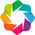

In [132]:
# imports
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

**Basic plots**

In [133]:
# HOLOVIEWS - Scatter plot
ds = hv.Dataset(iris, kdims=['sepalLength', 'petalLength', 'petalWidth', 'sepalWidth'], vdims=['species'])

points = ds.to(hv.Scatter, 'petalLength', 'petalWidth').overlay()
points.opts(width=400, height=400)

:NdOverlay   [sepalLength,sepalWidth]
   :Scatter   [petalLength]   (petalWidth)

In [73]:
# HOLOVIEWS - Scatter plot - with dropdown menu
ds = hv.Dataset(iris, kdims=['sepalLength', 'petalLength', 'petalWidth', 'sepalWidth'], vdims=['species'])
points = ds.to(hv.Scatter, 'petalLength', 'petalWidth')
points.opts(width=400, height=400)

:HoloMap   [sepalLength,sepalWidth]
   :Scatter   [petalLength]   (petalWidth)

In [50]:
# HOLOVIEWS - Scatter plot by group
ds = hv.Dataset(iris)
points = ds.to(hv.Points, ['petalLength', 'petalWidth'], groupby='species').overlay()
points.opts(width=400, height=400)

:NdOverlay   [species]
   :Points   [petalLength,petalWidth]

In [136]:
# HOLOVIEWS - Scatter plot by group - with dropdown menu
ds = hv.Dataset(iris)
points = ds.to(hv.Points, ['petalLength', 'petalWidth'], groupby='species')#.overlay()
points.opts(width=400, height=400)

:HoloMap   [species]
   :Points   [petalLength,petalWidth]

In [137]:
# HOLOVIEWS - Scatter plot by group with facets
ds = hv.Dataset(iris)
gridspace = ds.to(hv.Points, ['petalLength', 'petalWidth'], groupby='species').grid()
gridspace.opts(opts.Points(width=500, height=500))

:GridSpace   [species]
   :Points   [petalLength,petalWidth]

**Aesthetics plots**

In [63]:
# BOKEH - Scatter plot
# HOLOVIEWS - Scatter plot by group
ds = hv.Dataset(iris)
points = ds.to(hv.Points, ['petalLength', 'sepalLength'], groupby='species').overlay()
points.opts(
    opts.Points(width=600, height=400, size=5,
                title='Petal lengths vs. Sepal lengths', 
                xlabel='Petal Lengths (cm)', ylabel='Sepal Lengths (cm)',
                legend_position='right', toolbar='above', tools=['hover']))

:NdOverlay   [species]
   :Points   [petalLength,sepalLength]

**Other plots**

In [138]:
# HOLOVIEWS - Interactions
import numpy as np
from holoviews.plotting.links import DataLink

ds = hv.Dataset(iris)

sepal = ds.to(hv.Scatter, 'sepalLength', 'sepalWidth', groupby='species')#.overlay() # does not work with overlay()
petal = ds.to(hv.Scatter, 'petalLength', 'petalWidth', groupby='species')#.overlay() # does not work with overlay()

dlink = DataLink(sepal, petal)

(sepal+petal).opts(
    opts.Scatter(height = 350, width = 350, tools=['box_select', 'lasso_select']))

:Layout
   .HoloMap.I  :HoloMap   [species]
      :Scatter   [sepalLength]   (sepalWidth)
   .HoloMap.II :HoloMap   [species]
      :Scatter   [petalLength]   (petalWidth)

In [140]:
# HOLOVIEWS - Applying aggregations + putting graphs side by side
import numpy as np

table = hv.Table(iris)
bars_mean = hv.Bars(table, 'species', 'sepalLength').aggregate('species', function=np.mean)
bars_count = hv.Bars(table, 'species', 'sepalLength').aggregate('species', function=np.size)

bars_count + bars_mean

:Layout
   .Bars.I  :Bars   [species]   (sepalLength)
   .Bars.II :Bars   [species]   (sepalLength)

In [141]:
# HOLOVIEWS - Applying aggregations + putting graphs on top of one another
import numpy as np

table = hv.Table(iris)
bars_mean = hv.Bars(table, 'species', 'sepalLength').aggregate('species', function=np.mean)
bars_count = hv.Bars(table, 'species', 'sepalLength').aggregate('species', function=np.size)

bars_count * bars_mean

:Overlay
   .Bars.I  :Bars   [species]   (sepalLength)
   .Bars.II :Bars   [species]   (sepalLength)

**Exercise: Cars**

Provide a scatter plot of acceleration vs mpg by cylinder.

In [142]:
ds = hv.Dataset(cars)
points = ds.to(hv.Scatter, 'acceleration', 'mpg', groupby='cylinders')#.overlay()
points.opts(width=400, height=400)

:HoloMap   [cylinders]
   :Scatter   [acceleration]   (mpg)

**Exercise: Cars**

Provide bar chart of the average mpg per country.

In [143]:
table = hv.Table(cars)
bars_count = hv.Bars(table, 'country', 'mpg').aggregate('country', function=np.mean)
bars_count.opts(width=400, height=400)

:Bars   [country]   (mpg)

### ipywidgets
Description:
- Interactive HTML widgets for Jupyter notebooks 

Strengths and Weaknesses:
- Strengths
    - These widgets can be used with almost any other library
- Weaknesses
    - ...

Doc: https://ipywidgets.readthedocs.io/en/stable/

**Imports**

In [78]:
# libraries
# !pip install ipywidgets
# !jupyter nbextension enable --py widgetsnbextension

In [144]:
# imports
#from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np

**Use**

In [154]:
# Interact
def f(x):
    return x+x

# interact calls
interact(f, x=10);

interactive(children=(IntSlider(value=10, description='x', max=30, min=-10), Output()), _dom_classes=('widget-…

In [153]:
interact(f, x=(0,8,2));
interact(f, x=True);
interact(f, x='Hi there!');
interact(f, x=['apples','oranges']);

interactive(children=(IntSlider(value=10, description='x', max=30, min=-10), Output()), _dom_classes=('widget-…

interactive(children=(IntSlider(value=4, description='x', max=8, step=2), Output()), _dom_classes=('widget-int…

interactive(children=(Checkbox(value=True, description='x'), Output()), _dom_classes=('widget-interact',))

interactive(children=(Text(value='Hi there!', description='x'), Output()), _dom_classes=('widget-interact',))

interactive(children=(Dropdown(description='x', options=('apples', 'oranges'), value='apples'), Output()), _do…

In [155]:
# can also be used with decorators
@interact(x=True, y=1.0)
def g(x, y):
    return (x, y)

interactive(children=(Checkbox(value=True, description='x'), FloatSlider(value=1.0, description='y', max=3.0, …

In [157]:
# IPYWIDGETS with SEABORN
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

@widgets.interact_manual(palette=['pastel', 'GnBu_d', 'BuGn_r', 'Blues'], alpha=(0., 1.))
def plot(alpha=1., palette='pastel'):
    ax = sns.scatterplot(x='petalLength', y='sepalLength', hue='species', data=iris, alpha=alpha, palette=palette)

interactive(children=(FloatSlider(value=1.0, description='alpha', max=1.0), Dropdown(description='palette', op…

**Exercise: Tips**

Provide an interface plotting seaborn's violin plots showing the total_bill per day and allowing you to choose the column smoker or sex as ```hue```.

In [158]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

@widgets.interact_manual(hue=['smoker', 'sex'])
def plot(hue='sex'):
    ax = sns.violinplot(x="day", y="total_bill", hue=hue, data=tips, split=True)

interactive(children=(Dropdown(description='hue', index=1, options=('smoker', 'sex'), value='sex'), Button(des…

### qgrid
Description:
- Jupyter notebook widget which uses SlickGrid to render pandas DataFrames within a Jupyter notebook
- Allows you to explore your DataFrames with intuitive scrolling, sorting, and filtering controls, as well as edit your DataFrames by double clicking cells

Strengths and Weaknesses:
- Strengths
    - Interactive
    - Can be coupled with Matplotlib
- Weaknesses
    - ...
    
<img src='images/filtering_demo.gif'>

Doc: https://plotnine.readthedocs.io/en/stable/

**Imports**

In [8]:
# # libraries
# !pip install qgrid
#!jupyter nbextension enable --py qgrid
#!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension qgrid/extension...
      - Validating: OK
Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [8]:
# imports
import qgrid

**Use**

In [10]:
# QGRID - show pandas dataframes
qgrid_widget = qgrid.show_grid(iris, show_toolbar=True)
qgrid_widget

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

<IPython.core.display.Javascript object>


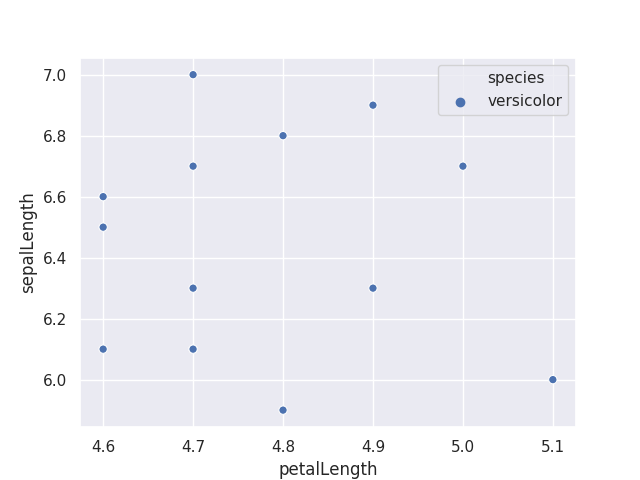

In [11]:
# QGRID - update SEABORN
%matplotlib nbagg
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

fig, ax = plt.subplots()
qgrid_df = qgrid_widget.get_changed_df()
ax = sns.scatterplot(x='petalLength', y='sepalLength', hue='species', data=qgrid_df)

def handle_filter_changed(event, widget):
    plt.clf()
    qgrid_df = qgrid_widget.get_changed_df()
    ax = sns.scatterplot(x='petalLength', y='sepalLength', hue='species', data=qgrid_df)

qgrid_widget.on('filter_changed', handle_filter_changed)

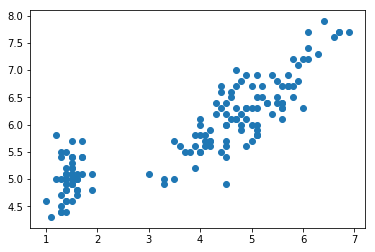

In [8]:
# if you now plot something, it will be inscluded in the QGRD format
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6,4)) 
plt.scatter(iris['petalLength'], iris['sepalLength']);

**Exercise: Cars**

Show the dataset and provide a connected Seaborn bar chart giving the averaged mpg per country.

In [13]:
qgrid_widget = qgrid.show_grid(cars, show_toolbar=False)
qgrid_widget

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

<IPython.core.display.Javascript object>


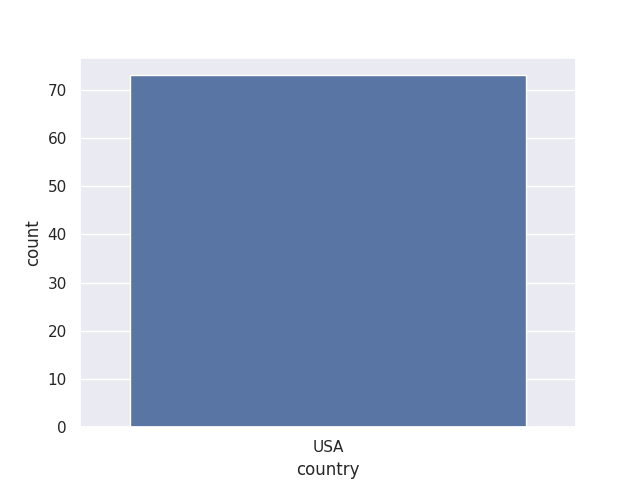

In [14]:
%matplotlib nbagg
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

fig, ax = plt.subplots()
qgrid_df = qgrid_widget.get_changed_df()
ax = sns.countplot(x="country", data=qgrid_df)

def handle_filter_changed(event, widget):
    plt.clf()
    qgrid_df = qgrid_widget.get_changed_df()
    ax = sns.countplot(x="country", data=qgrid_df)

qgrid_widget.on('filter_changed', handle_filter_changed)

In [22]:
# you need to disable and restart your notebook
!jupyter nbextension disable --py qgrid

Disabling notebook extension qgrid/extension...
      - Validating: OK


## Web Apps

### Dash by Plotly
Description:
- Maintained by Plotly
- Frontend: React + Plotly
- Backend: Flask

Strengths and Weaknesses:
- Strengths
    - Faster than Bokeh Server with big datasets
    - More consistent with data than Bokeh Server
- Weaknesses
    - Cannot be integrated into Flask application
    
<img src='images/dashh.png'>

Doc: https://dash.plot.ly/getting-started

**Imports**

In [ ]:
# installs
# !pip install dash #==0.39.0  # The core dash backend
# !pip install dash-daq #==0.1.0  # DAQ components (newly open-sourced!)

In [9]:
# imports
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.graph_objs as go

**Web apps**

In [10]:
# DASH BY PLOTLY - Static (but intercative) plot
external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

app = dash.Dash(__name__, external_stylesheets=external_stylesheets)

df = pd.read_csv(
    'https://gist.githubusercontent.com/chriddyp/' +
    '5d1ea79569ed194d432e56108a04d188/raw/' +
    'a9f9e8076b837d541398e999dcbac2b2826a81f8/'+
    'gdp-life-exp-2007.csv')


app.layout = html.Div([
    html.H1(children='Hello Dash'),
    html.Div(children='''
        Dash: A web application framework for Python.
    '''),
    dcc.Graph(
        id='life-exp-vs-gdp',
        figure={
            'data': [
                go.Scatter(
                    x=df[df['continent'] == i]['gdp per capita'],
                    y=df[df['continent'] == i]['life expectancy'],
                    text=df[df['continent'] == i]['country'],
                    mode='markers',
                    opacity=0.7,
                    marker={
                        'size': 15,
                        'line': {'width': 0.5, 'color': 'white'}
                    },
                    name=i
                ) for i in df.continent.unique()
            ],
            'layout': go.Layout(
                xaxis={'type': 'log', 'title': 'GDP Per Capita'},
                yaxis={'title': 'Life Expectancy'},
                margin={'l': 40, 'b': 40, 't': 10, 'r': 10},
                legend={'x': 0, 'y': 1},
                hovermode='closest'
            )
        }
    )
])

app.run_server(host='0.0.0.0', debug=False)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://0.0.0.0:8050/ (Press CTRL+C to quit)
172.25.0.1 - - [19/Apr/2019 13:20:56] "GET / HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:20:58] "GET /_dash-dependencies HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:20:58] "GET /_dash-layout HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:20:58] "GET /_favicon.ico HTTP/1.1" 200 -


In [11]:
from dash.dependencies import Input, Output

import pandas as pd
import plotly.graph_objs as go

external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

app = dash.Dash(__name__, external_stylesheets=external_stylesheets)

df = pd.read_csv(
    'https://gist.githubusercontent.com/chriddyp/'
    'cb5392c35661370d95f300086accea51/raw/'
    '8e0768211f6b747c0db42a9ce9a0937dafcbd8b2/'
    'indicators.csv')

available_indicators = df['Indicator Name'].unique()

app.layout = html.Div([
    html.Div([

        html.Div([
            dcc.Dropdown(
                id='xaxis-column',
                options=[{'label': i, 'value': i} for i in available_indicators],
                value='Fertility rate, total (births per woman)'
            ),
            dcc.RadioItems(
                id='xaxis-type',
                options=[{'label': i, 'value': i} for i in ['Linear', 'Log']],
                value='Linear',
                labelStyle={'display': 'inline-block'}
            )
        ],
        style={'width': '48%', 'display': 'inline-block'}),

        html.Div([
            dcc.Dropdown(
                id='yaxis-column',
                options=[{'label': i, 'value': i} for i in available_indicators],
                value='Life expectancy at birth, total (years)'
            ),
            dcc.RadioItems(
                id='yaxis-type',
                options=[{'label': i, 'value': i} for i in ['Linear', 'Log']],
                value='Linear',
                labelStyle={'display': 'inline-block'}
            )
        ],style={'width': '48%', 'float': 'right', 'display': 'inline-block'})
    ]),
    dcc.Graph(id='indicator-graphic'),
    dcc.Slider(
        id='year--slider',
        min=df['Year'].min(),
        max=df['Year'].max(),
        value=df['Year'].max(),
        marks={str(year): str(year) for year in df['Year'].unique()}
    )
])

@app.callback(
    Output('indicator-graphic', 'figure'),
    [Input('xaxis-column', 'value'),
     Input('yaxis-column', 'value'),
     Input('xaxis-type', 'value'),
     Input('yaxis-type', 'value'),
     Input('year--slider', 'value')])
def update_graph(xaxis_column_name, yaxis_column_name,
                 xaxis_type, yaxis_type,
                 year_value):
    dff = df[df['Year'] == year_value]

    return {
        'data': [go.Scatter(
            x=dff[dff['Indicator Name'] == xaxis_column_name]['Value'],
            y=dff[dff['Indicator Name'] == yaxis_column_name]['Value'],
            text=dff[dff['Indicator Name'] == yaxis_column_name]['Country Name'],
            mode='markers',
            marker={
                'size': 15,
                'opacity': 0.5,
                'line': {'width': 0.5, 'color': 'white'}
            }
        )],
        'layout': go.Layout(
            xaxis={
                'title': xaxis_column_name,
                'type': 'linear' if xaxis_type == 'Linear' else 'log'
            },
            yaxis={
                'title': yaxis_column_name,
                'type': 'linear' if yaxis_type == 'Linear' else 'log'
            },
            margin={'l': 40, 'b': 40, 't': 10, 'r': 0},
            hovermode='closest'
        )
    }


app.run_server(host='0.0.0.0', debug=False)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://0.0.0.0:8050/ (Press CTRL+C to quit)
172.25.0.1 - - [19/Apr/2019 13:31:08] "GET / HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:09] "GET /_dash-dependencies HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:09] "GET /_dash-layout HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:09] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:10] "GET /_favicon.ico HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:15] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:17] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:19] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:22] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:23] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:25] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:31:29] "POST /_dash-update-component 

**Exercise: Cars**


Create a Web App, with:
- a dropdown menu allowing to choose the country
- a scatter plot of mpg vs. horsepower
- a slider allowing to choose the cylinders

In [12]:
from dash.dependencies import Input, Output

import pandas as pd
import plotly.graph_objs as go

external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

app = dash.Dash(__name__, external_stylesheets=external_stylesheets)

available_countries = cars.country.unique()

app.layout = html.Div([
    html.Div([

        html.Div([
            dcc.Dropdown(
                id='country',
                options=[{'label': i, 'value': i} for i in available_countries],
                value='Country'
            )
        ])
    ]),
    dcc.Graph(id='scatterplot'),
    dcc.Slider(
        id='cyl-slider',
        min=cars.cylinders.min(),
        max=cars.cylinders.max(),
        value=cars.cylinders.max(),
        marks={str(cyl): str(cyl) for cyl in cars.cylinders.unique()}
    )
])

@app.callback(
    Output('scatterplot', 'figure'),
    [Input('country', 'value'),
     Input('cyl-slider', 'value')])
def update_graph(country, cylinder_slider):
    dff = cars[(cars.cylinders == cylinder_slider)&(cars.country == country)]

    return {
        'data': [go.Scatter(
            x=dff.horsepower,
            y=dff.mpg,
            mode='markers'
        )]
    }


app.run_server(host='0.0.0.0', debug=False)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://0.0.0.0:8050/ (Press CTRL+C to quit)
172.25.0.1 - - [19/Apr/2019 13:39:49] "GET / HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:50] "GET /_dash-layout HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:50] "GET /_dash-dependencies HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:50] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:50] "GET /_favicon.ico HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:53] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:55] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:56] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:39:58] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:40:04] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:40:05] "POST /_dash-update-component HTTP/1.1" 200 -
172.25.0.1 - - [19/Apr/2019 13:40:06] "POST /_dash-update-component 

### Bokeh Server
Description:
- Maintained by Anaconda
- Frontend: D3
- Backend: Tornado

Strengths and Weaknesses:
- Strengths
    - Nice possible interactions
- Weaknesses
    - Requires some Javascript knowledge (for interactions)
    - Slower than Dash Plotly with big datasets
    
<img src='images/bokehserver.png'>

Doc: https://bokeh.pydata.org/en/latest/docs/user_guide/server.html

**Web apps**

In [ ]:
# This code has to be written in a .py file!
import pandas as pd

from bokeh.layouts import row, column
from bokeh.models import Select
from bokeh.palettes import Spectral5
from bokeh.plotting import curdoc, figure

iris = pd.read_csv('data/iris.csv')

SIZES = list(range(6, 22, 3))
COLORS = Spectral5
N_SIZES = len(SIZES)
N_COLORS = len(COLORS)

columns = sorted(iris.columns)
discrete = [x for x in columns if iris[x].dtype == object]
continuous = [x for x in columns if x not in discrete]

def create_figure():
    xs = iris[x.value].values
    ys = iris[y.value].values
    x_title = x.value.title()
    y_title = y.value.title()

    kw = dict()
    if x.value in discrete:
        kw['x_range'] = sorted(set(xs))
    if y.value in discrete:
        kw['y_range'] = sorted(set(ys))
    kw['title'] = "%s vs %s" % (x_title, y_title)

    p = figure(plot_height=600, plot_width=800, tools='pan,box_zoom,hover,reset', **kw)
    p.xaxis.axis_label = x_title
    p.yaxis.axis_label = y_title

    if x.value in discrete:
        p.xaxis.major_label_orientation = pd.np.pi / 4

    sz = 9
    if size.value != 'None':
        groups = pd.qcut(iris[size.value].values, N_SIZES, duplicates='drop')
        sz = [SIZES[xx] for xx in groups.codes]

    c = "#31AADE"
    if color.value != 'None':
        groups = pd.qcut(iris[color.value].values, N_COLORS, duplicates='drop')
        c = [COLORS[xx] for xx in groups.codes]

    p.circle(x=xs, y=ys, color=c, size=sz, line_color="white", alpha=0.6, hover_color='white', hover_alpha=0.5)
    return p


def update(attr, old, new):
    layout.children[1] = create_figure()


x = Select(title='X-Axis', value='petalLength', options=columns)
x.on_change('value', update)

y = Select(title='Y-Axis', value='sepalLength', options=columns)
y.on_change('value', update)

size = Select(title='Size', value='None', options=['None'] + continuous)
size.on_change('value', update)

color = Select(title='Color', value='None', options=['None'] + continuous)
color.on_change('value', update)

controls = column([x, y, color, size])
layout = row(controls, create_figure())

curdoc().add_root(layout)
curdoc().title = "Crossfilter"

In [13]:
# this line has to be used in the terminal (or with a '!' in front in the notebook)
!bokeh serve Bokeh_apps/app_1.py --port 8050 --address 0.0.0.0 --allow-websocket-origin=localhost:8891
# then go to http://localhost:8891/app_1

2019-04-19 14:01:10,594 Starting Bokeh server version 1.1.0 (running on Tornado 6.0.2)
2019-04-19 14:01:10,595 Bokeh app running at: http://0.0.0.0:8050/app_1
2019-04-19 14:01:10,595 Starting Bokeh server with process id: 285
2019-04-19 14:01:12,387 302 GET / (172.25.0.1) 1.23ms
2019-04-19 14:01:12,456 200 GET /app_1 (172.25.0.1) 51.47ms
2019-04-19 14:01:12,712 101 GET /app_1/ws?bokeh-protocol-version=1.0&bokeh-session-id=d6zHsrG7nPbdrSFr7VmdbutdKF3ctlTzgQ4Mof5IINr3 (172.25.0.1) 0.62ms
2019-04-19 14:01:12,713 WebSocket connection opened
2019-04-19 14:01:12,713 ServerConnection created
^C

Interrupted, shutting down


**Exercise: Cars**

Create a Web App, with:
- a dropdown menu allowing to choose the country
- a scatter plot of mpg vs. horsepower
- a slider allowing to choose the cylinders

In [14]:
# check solution at Bokeh_apps/app_2.py
!bokeh serve Bokeh_apps/app_2.py --port 8050 --address 0.0.0.0 --allow-websocket-origin=localhost:8891

2019-04-19 14:10:23,424 Starting Bokeh server version 1.1.0 (running on Tornado 6.0.2)
2019-04-19 14:10:23,425 Bokeh app running at: http://0.0.0.0:8050/app_2
2019-04-19 14:10:23,425 Starting Bokeh server with process id: 294
2019-04-19 14:10:25,140 404 GET /app_1 (172.25.0.1) 1.28ms
2019-04-19 14:10:26,534 404 GET /app_1 (172.25.0.1) 1.16ms
2019-04-19 14:10:27,256 404 GET /app_1 (172.25.0.1) 1.16ms
2019-04-19 14:10:31,680 200 GET /app_2 (172.25.0.1) 54.92ms
2019-04-19 14:10:31,917 101 GET /app_2/ws?bokeh-protocol-version=1.0&bokeh-session-id=JYq5T7A4XOkCuqNoEM0WLQ6wNaUp2rfTqhkpmUx9hXp2 (172.25.0.1) 1.65ms
2019-04-19 14:10:31,917 WebSocket connection opened
2019-04-19 14:10:31,918 ServerConnection created
^C

Interrupted, shutting down


## Specific plots

### Machine Learning: PAIR Facets
Description:
- Word Cloud generator in Python

<img src='images/facets.png'>

Doc: https://github.com/PAIR-code/facets

**Imports**

In [66]:
# # libraries
# # In Chrome enable webGL in at chrome://flags/
# !sudo apt-get update -y
# !sudo apt-get install git -y
# !git clone https://github.com/PAIR-code/facets
# !cd facets
# !pip install --upgrade google-api-python-client
# !sudo conda install -y protobuf

In [15]:
# imports
import pandas as pd

# data
features = ["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status",
            "Occupation", "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss",
            "Hours per week", "Country", "Target"]
train_data = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
    names=features,
    sep=r'\s*,\s*',
    engine='python',
    na_values="?")
test_data = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test",
    names=features,
    sep=r'\s*,\s*',
    skiprows=[0],
    engine='python',
    na_values="?")

**Use**

In [16]:
# Add the path to the feature stats generation code.
import sys
sys.path.insert(0, 'facets/facets_overview/python/')

# Create the feature stats for the datasets and stringify it.
import base64
from generic_feature_statistics_generator import GenericFeatureStatisticsGenerator

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'train', 'table': train_data},
                                  {'name': 'test', 'table': test_data}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

In [19]:
# Display the facets overview visualization for this data
from IPython.core.display import display, HTML

HTML_TEMPLATE = """<link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/master/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html = HTML_TEMPLATE.format(protostr=protostr)
# display(HTML(html))

In [22]:
# Display the Dive visualization for the training data.
from IPython.core.display import display, HTML

jsonstr = train_data.to_json(orient='records')
HTML_TEMPLATE = """<link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/master/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

**Exercise: Titanic**

Open the Titanic dataset (from the csv file directly) and open both:
- the Facets overview visualization
- the Dive visualization

in order to explore de dataset.

### Text: wordcloud
Description:
- Word Cloud generator in Python

<img src='images/wc.png'>

Doc: https://amueller.github.io/word_cloud/index.html

**Imports**

In [ ]:
# libraries
# !pip install wordcloud

In [ ]:
# imports
from wordcloud import WordCloud
import matplotlib.pyplot as plt

**Plots**

In [ ]:
import os
from os import path

text = open('data/constitution.txt').read()
wordcloud = WordCloud(max_font_size=200, width = 1000, height=600).generate(text)

# Display the generated image with matplotlib
fig, ax = plt.subplots(figsize=(18,8)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

### Text: scattertext
Description:
- A tool for finding distinguishing terms in small-to-medium-sized corpora, and presenting them in a sexy, interactive scatter plot with non-overlapping term labels. Exploratory data analysis just got more fun.

<img src='images/scattertext.png'>

Doc: https://github.com/JasonKessler/scattertext

**Imports**

In [ ]:
# libraries
# !pip install scattertext
# !pip install spacy && python -m spacy download en
# !pip install jieba spacy empath astropy gensim umap-learn

In [159]:
# imports
import scattertext as st
import spacy

**Plots**

In [165]:
# convention_df.head()

In [160]:
convention_df = st.SampleCorpora.ConventionData2012.get_data()
nlp = spacy.load('en')
corpus = st.CorpusFromPandas(convention_df, 
                             category_col='party', 
                             text_col='text',
                             nlp=nlp).build()
print(list(corpus.get_scaled_f_scores_vs_background().index[:10]))

['obama', 'romney', 'barack', 'mitt', 'obamacare', 'biden', 'romneys', 'hardworking', 'bailouts', 'autoworkers']


In [170]:
term_freq_df.head()

,democrat freq,republican freq,Democratic Score,Republican Score
term,,,,
thank,158,205,0.068202,0.931798
you,834,792,0.102691,0.897309
thank you,150,195,0.068010,0.931990
so,341,212,0.903482,0.096518
much,84,75,0.110620,0.889380


In [166]:
# Democrats
term_freq_df = corpus.get_term_freq_df()
term_freq_df['Democratic Score'] = corpus.get_scaled_f_scores('democrat')
print(list(term_freq_df.sort_values(by='Democratic Score', ascending=False).index[:10]))

['middle class', 'forward', 'class', 'middle', 'the middle', 'pay', 'medicare', 'education', 'health', 'president obama']


In [167]:
# Republicans
term_freq_df['Republican Score'] = corpus.get_scaled_f_scores('republican')
print(list(term_freq_df.sort_values(by='Republican Score', ascending=False).index[:10]))

['government', 'administration', 'business', 'can do', 'success', 'story', 'unemployment', 'freedom', 'paul', 'do better']


In [ ]:
html = st.produce_scattertext_explorer(
    corpus,
    category='democrat',
    category_name='Democratic',
    not_category_name='Republican',
    width_in_pixels=1000,
    metadata=convention_df['speaker'])
open("Convention-Visualization.html", 'wb').write(html.encode('utf-8'));

### Missingno
Description:
- Missing data visualization module for Python

<img src='images/missingno.png'>

Doc: https://github.com/ResidentMario/missingno

**Imports**

In [ ]:
# libraries
# !pip install missingno

# dataset libraries
# !pip install quilt
# !quilt install ResidentMario/missingno_data

In [ ]:
# imports
from quilt.data.ResidentMario import missingno_data
import missingno as msno
import numpy as np

**Plots**

In [ ]:
# data
collisions = missingno_data.nyc_collision_factors()
collisions = collisions.replace("nan", np.nan)

In [ ]:
# MISSINGNO - Matrix plot
msno.matrix(collisions.sample(250));

In [ ]:
# MISSINGNO - Bar chart
msno.bar(collisions.sample(1000));

In [ ]:
# MISSINGNO - Heatmap
msno.heatmap(collisions);

In [ ]:
# MISSINGNO - Dendogram
msno.dendrogram(collisions);

References:
- http://pythonplot.com/
- https://malramsay.com/post/adventures_in_visualisation/